# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [25]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162321.jpg  
  inflating: processed_celeba_small/celeba/162322.jpg  
  inflating: processed_celeba_small/celeba/162323.jpg  
  inflating: processed_celeba_small/celeba/162324.jpg  
  inflating: processed_celeba_small/celeba/162325.jpg  
  inflating: processed_celeba_small/celeba/162326.jpg  
  inflating: processed_celeba_small/celeba/162327.jpg  
  inflating: processed_celeba_small/celeba/162328.jpg  
  inflating: processed_celeba_small/celeba/162329.jpg  
  inflating: processed_celeba_small/celeba/162330.jpg  
  inflating: processed_celeba_small/celeba/162331.jpg  
  inflating: processed_celeba_small/celeba/162332.jpg  
  inflating: processed_celeba_small/celeba/162333.jpg  
  inflating: processed_celeba_small/celeba/162334.jpg  
  inflating: processed_celeba_small/celeba/162335.jpg  
  inflating: processed_celeba_small/celeba/162336.jpg  
  inflating: processed_celeba_small/celeba/162337.jpg  
  inflating: processed_celeba_small/celeba/16233

  inflating: processed_celeba_small/celeba/162878.jpg  
  inflating: processed_celeba_small/celeba/162879.jpg  
  inflating: processed_celeba_small/celeba/162880.jpg  
  inflating: processed_celeba_small/celeba/162881.jpg  
  inflating: processed_celeba_small/celeba/162882.jpg  
  inflating: processed_celeba_small/celeba/162883.jpg  
  inflating: processed_celeba_small/celeba/162884.jpg  
  inflating: processed_celeba_small/celeba/162885.jpg  
  inflating: processed_celeba_small/celeba/162886.jpg  
  inflating: processed_celeba_small/celeba/162887.jpg  
  inflating: processed_celeba_small/celeba/162888.jpg  
  inflating: processed_celeba_small/celeba/162889.jpg  
  inflating: processed_celeba_small/celeba/162890.jpg  
  inflating: processed_celeba_small/celeba/162891.jpg  
  inflating: processed_celeba_small/celeba/162892.jpg  
  inflating: processed_celeba_small/celeba/162893.jpg  
  inflating: processed_celeba_small/celeba/162894.jpg  
  inflating: processed_celeba_small/celeba/16289

  inflating: processed_celeba_small/celeba/163187.jpg  
  inflating: processed_celeba_small/celeba/163188.jpg  
  inflating: processed_celeba_small/celeba/163189.jpg  
  inflating: processed_celeba_small/celeba/163190.jpg  
  inflating: processed_celeba_small/celeba/163191.jpg  
  inflating: processed_celeba_small/celeba/163192.jpg  
  inflating: processed_celeba_small/celeba/163193.jpg  
  inflating: processed_celeba_small/celeba/163194.jpg  
  inflating: processed_celeba_small/celeba/163195.jpg  
  inflating: processed_celeba_small/celeba/163196.jpg  
  inflating: processed_celeba_small/celeba/163197.jpg  
  inflating: processed_celeba_small/celeba/163198.jpg  
  inflating: processed_celeba_small/celeba/163199.jpg  
  inflating: processed_celeba_small/celeba/163200.jpg  
  inflating: processed_celeba_small/celeba/163201.jpg  
  inflating: processed_celeba_small/celeba/163202.jpg  
  inflating: processed_celeba_small/celeba/163203.jpg  
  inflating: processed_celeba_small/celeba/16320

  inflating: processed_celeba_small/celeba/163671.jpg  
  inflating: processed_celeba_small/celeba/163672.jpg  
  inflating: processed_celeba_small/celeba/163673.jpg  
  inflating: processed_celeba_small/celeba/163674.jpg  
  inflating: processed_celeba_small/celeba/163675.jpg  
  inflating: processed_celeba_small/celeba/163676.jpg  
  inflating: processed_celeba_small/celeba/163677.jpg  
  inflating: processed_celeba_small/celeba/163678.jpg  
  inflating: processed_celeba_small/celeba/163679.jpg  
  inflating: processed_celeba_small/celeba/163680.jpg  
  inflating: processed_celeba_small/celeba/163681.jpg  
  inflating: processed_celeba_small/celeba/163682.jpg  
  inflating: processed_celeba_small/celeba/163683.jpg  
  inflating: processed_celeba_small/celeba/163684.jpg  
  inflating: processed_celeba_small/celeba/163685.jpg  
  inflating: processed_celeba_small/celeba/163686.jpg  
  inflating: processed_celeba_small/celeba/163687.jpg  
  inflating: processed_celeba_small/celeba/16368

  inflating: processed_celeba_small/celeba/163916.jpg  
  inflating: processed_celeba_small/celeba/163917.jpg  
  inflating: processed_celeba_small/celeba/163918.jpg  
  inflating: processed_celeba_small/celeba/163919.jpg  
  inflating: processed_celeba_small/celeba/163920.jpg  
  inflating: processed_celeba_small/celeba/163921.jpg  
  inflating: processed_celeba_small/celeba/163922.jpg  
  inflating: processed_celeba_small/celeba/163923.jpg  
  inflating: processed_celeba_small/celeba/163924.jpg  
  inflating: processed_celeba_small/celeba/163925.jpg  
  inflating: processed_celeba_small/celeba/163926.jpg  
  inflating: processed_celeba_small/celeba/163927.jpg  
  inflating: processed_celeba_small/celeba/163928.jpg  
  inflating: processed_celeba_small/celeba/163929.jpg  
  inflating: processed_celeba_small/celeba/163930.jpg  
  inflating: processed_celeba_small/celeba/163931.jpg  
  inflating: processed_celeba_small/celeba/163932.jpg  
  inflating: processed_celeba_small/celeba/16393

  inflating: processed_celeba_small/celeba/164161.jpg  
  inflating: processed_celeba_small/celeba/164162.jpg  
  inflating: processed_celeba_small/celeba/164163.jpg  
  inflating: processed_celeba_small/celeba/164164.jpg  
  inflating: processed_celeba_small/celeba/164165.jpg  
  inflating: processed_celeba_small/celeba/164166.jpg  
  inflating: processed_celeba_small/celeba/164167.jpg  
  inflating: processed_celeba_small/celeba/164168.jpg  
  inflating: processed_celeba_small/celeba/164169.jpg  
  inflating: processed_celeba_small/celeba/164170.jpg  
  inflating: processed_celeba_small/celeba/164171.jpg  
  inflating: processed_celeba_small/celeba/164172.jpg  
  inflating: processed_celeba_small/celeba/164173.jpg  
  inflating: processed_celeba_small/celeba/164174.jpg  
  inflating: processed_celeba_small/celeba/164175.jpg  
  inflating: processed_celeba_small/celeba/164176.jpg  
  inflating: processed_celeba_small/celeba/164177.jpg  
  inflating: processed_celeba_small/celeba/16417

  inflating: processed_celeba_small/celeba/164671.jpg  
  inflating: processed_celeba_small/celeba/164672.jpg  
  inflating: processed_celeba_small/celeba/164673.jpg  
  inflating: processed_celeba_small/celeba/164674.jpg  
  inflating: processed_celeba_small/celeba/164675.jpg  
  inflating: processed_celeba_small/celeba/164676.jpg  
  inflating: processed_celeba_small/celeba/164677.jpg  
  inflating: processed_celeba_small/celeba/164678.jpg  
  inflating: processed_celeba_small/celeba/164679.jpg  
  inflating: processed_celeba_small/celeba/164680.jpg  
  inflating: processed_celeba_small/celeba/164681.jpg  
  inflating: processed_celeba_small/celeba/164682.jpg  
  inflating: processed_celeba_small/celeba/164683.jpg  
  inflating: processed_celeba_small/celeba/164684.jpg  
  inflating: processed_celeba_small/celeba/164685.jpg  
  inflating: processed_celeba_small/celeba/164686.jpg  
  inflating: processed_celeba_small/celeba/164687.jpg  
  inflating: processed_celeba_small/celeba/16468

  inflating: processed_celeba_small/celeba/165203.jpg  
  inflating: processed_celeba_small/celeba/165204.jpg  
  inflating: processed_celeba_small/celeba/165205.jpg  
  inflating: processed_celeba_small/celeba/165206.jpg  
  inflating: processed_celeba_small/celeba/165207.jpg  
  inflating: processed_celeba_small/celeba/165208.jpg  
  inflating: processed_celeba_small/celeba/165209.jpg  
  inflating: processed_celeba_small/celeba/165210.jpg  
  inflating: processed_celeba_small/celeba/165211.jpg  
  inflating: processed_celeba_small/celeba/165212.jpg  
  inflating: processed_celeba_small/celeba/165213.jpg  
  inflating: processed_celeba_small/celeba/165214.jpg  
  inflating: processed_celeba_small/celeba/165215.jpg  
  inflating: processed_celeba_small/celeba/165216.jpg  
  inflating: processed_celeba_small/celeba/165217.jpg  
  inflating: processed_celeba_small/celeba/165218.jpg  
  inflating: processed_celeba_small/celeba/165219.jpg  
  inflating: processed_celeba_small/celeba/16522

  inflating: processed_celeba_small/celeba/165584.jpg  
  inflating: processed_celeba_small/celeba/165585.jpg  
  inflating: processed_celeba_small/celeba/165586.jpg  
  inflating: processed_celeba_small/celeba/165587.jpg  
  inflating: processed_celeba_small/celeba/165588.jpg  
  inflating: processed_celeba_small/celeba/165589.jpg  
  inflating: processed_celeba_small/celeba/165590.jpg  
  inflating: processed_celeba_small/celeba/165591.jpg  
  inflating: processed_celeba_small/celeba/165592.jpg  
  inflating: processed_celeba_small/celeba/165593.jpg  
  inflating: processed_celeba_small/celeba/165594.jpg  
  inflating: processed_celeba_small/celeba/165595.jpg  
  inflating: processed_celeba_small/celeba/165596.jpg  
  inflating: processed_celeba_small/celeba/165597.jpg  
  inflating: processed_celeba_small/celeba/165598.jpg  
  inflating: processed_celeba_small/celeba/165599.jpg  
  inflating: processed_celeba_small/celeba/165600.jpg  
  inflating: processed_celeba_small/celeba/16560

  inflating: processed_celeba_small/celeba/166154.jpg  
  inflating: processed_celeba_small/celeba/166155.jpg  
  inflating: processed_celeba_small/celeba/166156.jpg  
  inflating: processed_celeba_small/celeba/166157.jpg  
  inflating: processed_celeba_small/celeba/166158.jpg  
  inflating: processed_celeba_small/celeba/166159.jpg  
  inflating: processed_celeba_small/celeba/166160.jpg  
  inflating: processed_celeba_small/celeba/166161.jpg  
  inflating: processed_celeba_small/celeba/166162.jpg  
  inflating: processed_celeba_small/celeba/166163.jpg  
  inflating: processed_celeba_small/celeba/166164.jpg  
  inflating: processed_celeba_small/celeba/166165.jpg  
  inflating: processed_celeba_small/celeba/166166.jpg  
  inflating: processed_celeba_small/celeba/166167.jpg  
  inflating: processed_celeba_small/celeba/166168.jpg  
  inflating: processed_celeba_small/celeba/166169.jpg  
  inflating: processed_celeba_small/celeba/166170.jpg  
  inflating: processed_celeba_small/celeba/16617

  inflating: processed_celeba_small/celeba/166521.jpg  
  inflating: processed_celeba_small/celeba/166522.jpg  
  inflating: processed_celeba_small/celeba/166523.jpg  
  inflating: processed_celeba_small/celeba/166524.jpg  
  inflating: processed_celeba_small/celeba/166525.jpg  
  inflating: processed_celeba_small/celeba/166526.jpg  
  inflating: processed_celeba_small/celeba/166527.jpg  
  inflating: processed_celeba_small/celeba/166528.jpg  
  inflating: processed_celeba_small/celeba/166529.jpg  
  inflating: processed_celeba_small/celeba/166530.jpg  
  inflating: processed_celeba_small/celeba/166531.jpg  
  inflating: processed_celeba_small/celeba/166532.jpg  
  inflating: processed_celeba_small/celeba/166533.jpg  
  inflating: processed_celeba_small/celeba/166534.jpg  
  inflating: processed_celeba_small/celeba/166535.jpg  
  inflating: processed_celeba_small/celeba/166536.jpg  
  inflating: processed_celeba_small/celeba/166537.jpg  
  inflating: processed_celeba_small/celeba/16653

  inflating: processed_celeba_small/celeba/167087.jpg  
  inflating: processed_celeba_small/celeba/167088.jpg  
  inflating: processed_celeba_small/celeba/167089.jpg  
  inflating: processed_celeba_small/celeba/167090.jpg  
  inflating: processed_celeba_small/celeba/167091.jpg  
  inflating: processed_celeba_small/celeba/167092.jpg  
  inflating: processed_celeba_small/celeba/167093.jpg  
  inflating: processed_celeba_small/celeba/167094.jpg  
  inflating: processed_celeba_small/celeba/167095.jpg  
  inflating: processed_celeba_small/celeba/167096.jpg  
  inflating: processed_celeba_small/celeba/167097.jpg  
  inflating: processed_celeba_small/celeba/167098.jpg  
  inflating: processed_celeba_small/celeba/167099.jpg  
  inflating: processed_celeba_small/celeba/167100.jpg  
  inflating: processed_celeba_small/celeba/167101.jpg  
  inflating: processed_celeba_small/celeba/167102.jpg  
  inflating: processed_celeba_small/celeba/167103.jpg  
  inflating: processed_celeba_small/celeba/16710

  inflating: processed_celeba_small/celeba/167473.jpg  
  inflating: processed_celeba_small/celeba/167474.jpg  
  inflating: processed_celeba_small/celeba/167475.jpg  
  inflating: processed_celeba_small/celeba/167476.jpg  
  inflating: processed_celeba_small/celeba/167477.jpg  
  inflating: processed_celeba_small/celeba/167478.jpg  
  inflating: processed_celeba_small/celeba/167479.jpg  
  inflating: processed_celeba_small/celeba/167480.jpg  
  inflating: processed_celeba_small/celeba/167481.jpg  
  inflating: processed_celeba_small/celeba/167482.jpg  
  inflating: processed_celeba_small/celeba/167483.jpg  
  inflating: processed_celeba_small/celeba/167484.jpg  
  inflating: processed_celeba_small/celeba/167485.jpg  
  inflating: processed_celeba_small/celeba/167486.jpg  
  inflating: processed_celeba_small/celeba/167487.jpg  
  inflating: processed_celeba_small/celeba/167488.jpg  
  inflating: processed_celeba_small/celeba/167489.jpg  
  inflating: processed_celeba_small/celeba/16749

  inflating: processed_celeba_small/celeba/168033.jpg  
  inflating: processed_celeba_small/celeba/168034.jpg  
  inflating: processed_celeba_small/celeba/168035.jpg  
  inflating: processed_celeba_small/celeba/168036.jpg  
  inflating: processed_celeba_small/celeba/168037.jpg  
  inflating: processed_celeba_small/celeba/168038.jpg  
  inflating: processed_celeba_small/celeba/168039.jpg  
  inflating: processed_celeba_small/celeba/168040.jpg  
  inflating: processed_celeba_small/celeba/168041.jpg  
  inflating: processed_celeba_small/celeba/168042.jpg  
  inflating: processed_celeba_small/celeba/168043.jpg  
  inflating: processed_celeba_small/celeba/168044.jpg  
  inflating: processed_celeba_small/celeba/168045.jpg  
  inflating: processed_celeba_small/celeba/168046.jpg  
  inflating: processed_celeba_small/celeba/168047.jpg  
  inflating: processed_celeba_small/celeba/168048.jpg  
  inflating: processed_celeba_small/celeba/168049.jpg  
  inflating: processed_celeba_small/celeba/16805

  inflating: processed_celeba_small/celeba/168412.jpg  
  inflating: processed_celeba_small/celeba/168413.jpg  
  inflating: processed_celeba_small/celeba/168414.jpg  
  inflating: processed_celeba_small/celeba/168415.jpg  
  inflating: processed_celeba_small/celeba/168416.jpg  
  inflating: processed_celeba_small/celeba/168417.jpg  
  inflating: processed_celeba_small/celeba/168418.jpg  
  inflating: processed_celeba_small/celeba/168419.jpg  
  inflating: processed_celeba_small/celeba/168420.jpg  
  inflating: processed_celeba_small/celeba/168421.jpg  
  inflating: processed_celeba_small/celeba/168422.jpg  
  inflating: processed_celeba_small/celeba/168423.jpg  
  inflating: processed_celeba_small/celeba/168424.jpg  
  inflating: processed_celeba_small/celeba/168425.jpg  
  inflating: processed_celeba_small/celeba/168426.jpg  
  inflating: processed_celeba_small/celeba/168427.jpg  
  inflating: processed_celeba_small/celeba/168428.jpg  
  inflating: processed_celeba_small/celeba/16842

  inflating: processed_celeba_small/celeba/168968.jpg  
  inflating: processed_celeba_small/celeba/168969.jpg  
  inflating: processed_celeba_small/celeba/168970.jpg  
  inflating: processed_celeba_small/celeba/168971.jpg  
  inflating: processed_celeba_small/celeba/168972.jpg  
  inflating: processed_celeba_small/celeba/168973.jpg  
  inflating: processed_celeba_small/celeba/168974.jpg  
  inflating: processed_celeba_small/celeba/168975.jpg  
  inflating: processed_celeba_small/celeba/168976.jpg  
  inflating: processed_celeba_small/celeba/168977.jpg  
  inflating: processed_celeba_small/celeba/168978.jpg  
  inflating: processed_celeba_small/celeba/168979.jpg  
  inflating: processed_celeba_small/celeba/168980.jpg  
  inflating: processed_celeba_small/celeba/168981.jpg  
  inflating: processed_celeba_small/celeba/168982.jpg  
  inflating: processed_celeba_small/celeba/168983.jpg  
  inflating: processed_celeba_small/celeba/168984.jpg  
  inflating: processed_celeba_small/celeba/16898

  inflating: processed_celeba_small/celeba/169361.jpg  
  inflating: processed_celeba_small/celeba/169362.jpg  
  inflating: processed_celeba_small/celeba/169363.jpg  
  inflating: processed_celeba_small/celeba/169364.jpg  
  inflating: processed_celeba_small/celeba/169365.jpg  
  inflating: processed_celeba_small/celeba/169366.jpg  
  inflating: processed_celeba_small/celeba/169367.jpg  
  inflating: processed_celeba_small/celeba/169368.jpg  
  inflating: processed_celeba_small/celeba/169369.jpg  
  inflating: processed_celeba_small/celeba/169370.jpg  
  inflating: processed_celeba_small/celeba/169371.jpg  
  inflating: processed_celeba_small/celeba/169372.jpg  
  inflating: processed_celeba_small/celeba/169373.jpg  
  inflating: processed_celeba_small/celeba/169374.jpg  
  inflating: processed_celeba_small/celeba/169375.jpg  
  inflating: processed_celeba_small/celeba/169376.jpg  
  inflating: processed_celeba_small/celeba/169377.jpg  
  inflating: processed_celeba_small/celeba/16937

  inflating: processed_celeba_small/celeba/169937.jpg  
  inflating: processed_celeba_small/celeba/169938.jpg  
  inflating: processed_celeba_small/celeba/169939.jpg  
  inflating: processed_celeba_small/celeba/169940.jpg  
  inflating: processed_celeba_small/celeba/169941.jpg  
  inflating: processed_celeba_small/celeba/169942.jpg  
  inflating: processed_celeba_small/celeba/169943.jpg  
  inflating: processed_celeba_small/celeba/169944.jpg  
  inflating: processed_celeba_small/celeba/169945.jpg  
  inflating: processed_celeba_small/celeba/169946.jpg  
  inflating: processed_celeba_small/celeba/169947.jpg  
  inflating: processed_celeba_small/celeba/169948.jpg  
  inflating: processed_celeba_small/celeba/169949.jpg  
  inflating: processed_celeba_small/celeba/169950.jpg  
  inflating: processed_celeba_small/celeba/169951.jpg  
  inflating: processed_celeba_small/celeba/169952.jpg  
  inflating: processed_celeba_small/celeba/169953.jpg  
  inflating: processed_celeba_small/celeba/16995

  inflating: processed_celeba_small/celeba/170341.jpg  
  inflating: processed_celeba_small/celeba/170342.jpg  
  inflating: processed_celeba_small/celeba/170343.jpg  
  inflating: processed_celeba_small/celeba/170344.jpg  
  inflating: processed_celeba_small/celeba/170345.jpg  
  inflating: processed_celeba_small/celeba/170346.jpg  
  inflating: processed_celeba_small/celeba/170347.jpg  
  inflating: processed_celeba_small/celeba/170348.jpg  
  inflating: processed_celeba_small/celeba/170349.jpg  
  inflating: processed_celeba_small/celeba/170350.jpg  
  inflating: processed_celeba_small/celeba/170351.jpg  
  inflating: processed_celeba_small/celeba/170352.jpg  
  inflating: processed_celeba_small/celeba/170353.jpg  
  inflating: processed_celeba_small/celeba/170354.jpg  
  inflating: processed_celeba_small/celeba/170355.jpg  
  inflating: processed_celeba_small/celeba/170356.jpg  
  inflating: processed_celeba_small/celeba/170357.jpg  
  inflating: processed_celeba_small/celeba/17035

  inflating: processed_celeba_small/celeba/170906.jpg  
  inflating: processed_celeba_small/celeba/170907.jpg  
  inflating: processed_celeba_small/celeba/170908.jpg  
  inflating: processed_celeba_small/celeba/170909.jpg  
  inflating: processed_celeba_small/celeba/170910.jpg  
  inflating: processed_celeba_small/celeba/170911.jpg  
  inflating: processed_celeba_small/celeba/170912.jpg  
  inflating: processed_celeba_small/celeba/170913.jpg  
  inflating: processed_celeba_small/celeba/170914.jpg  
  inflating: processed_celeba_small/celeba/170915.jpg  
  inflating: processed_celeba_small/celeba/170916.jpg  
  inflating: processed_celeba_small/celeba/170917.jpg  
  inflating: processed_celeba_small/celeba/170918.jpg  
  inflating: processed_celeba_small/celeba/170919.jpg  
  inflating: processed_celeba_small/celeba/170920.jpg  
  inflating: processed_celeba_small/celeba/170921.jpg  
  inflating: processed_celeba_small/celeba/170922.jpg  
  inflating: processed_celeba_small/celeba/17092

  inflating: processed_celeba_small/celeba/171289.jpg  
  inflating: processed_celeba_small/celeba/171290.jpg  
  inflating: processed_celeba_small/celeba/171291.jpg  
  inflating: processed_celeba_small/celeba/171292.jpg  
  inflating: processed_celeba_small/celeba/171293.jpg  
  inflating: processed_celeba_small/celeba/171294.jpg  
  inflating: processed_celeba_small/celeba/171295.jpg  
  inflating: processed_celeba_small/celeba/171296.jpg  
  inflating: processed_celeba_small/celeba/171297.jpg  
  inflating: processed_celeba_small/celeba/171298.jpg  
  inflating: processed_celeba_small/celeba/171299.jpg  
  inflating: processed_celeba_small/celeba/171300.jpg  
  inflating: processed_celeba_small/celeba/171301.jpg  
  inflating: processed_celeba_small/celeba/171302.jpg  
  inflating: processed_celeba_small/celeba/171303.jpg  
  inflating: processed_celeba_small/celeba/171304.jpg  
  inflating: processed_celeba_small/celeba/171305.jpg  
  inflating: processed_celeba_small/celeba/17130

  inflating: processed_celeba_small/celeba/171858.jpg  
  inflating: processed_celeba_small/celeba/171859.jpg  
  inflating: processed_celeba_small/celeba/171860.jpg  
  inflating: processed_celeba_small/celeba/171861.jpg  
  inflating: processed_celeba_small/celeba/171862.jpg  
  inflating: processed_celeba_small/celeba/171863.jpg  
  inflating: processed_celeba_small/celeba/171864.jpg  
  inflating: processed_celeba_small/celeba/171865.jpg  
  inflating: processed_celeba_small/celeba/171866.jpg  
  inflating: processed_celeba_small/celeba/171867.jpg  
  inflating: processed_celeba_small/celeba/171868.jpg  
  inflating: processed_celeba_small/celeba/171869.jpg  
  inflating: processed_celeba_small/celeba/171870.jpg  
  inflating: processed_celeba_small/celeba/171871.jpg  
  inflating: processed_celeba_small/celeba/171872.jpg  
  inflating: processed_celeba_small/celeba/171873.jpg  
  inflating: processed_celeba_small/celeba/171874.jpg  
  inflating: processed_celeba_small/celeba/17187

  inflating: processed_celeba_small/celeba/172244.jpg  
  inflating: processed_celeba_small/celeba/172245.jpg  
  inflating: processed_celeba_small/celeba/172246.jpg  
  inflating: processed_celeba_small/celeba/172247.jpg  
  inflating: processed_celeba_small/celeba/172248.jpg  
  inflating: processed_celeba_small/celeba/172249.jpg  
  inflating: processed_celeba_small/celeba/172250.jpg  
  inflating: processed_celeba_small/celeba/172251.jpg  
  inflating: processed_celeba_small/celeba/172252.jpg  
  inflating: processed_celeba_small/celeba/172253.jpg  
  inflating: processed_celeba_small/celeba/172254.jpg  
  inflating: processed_celeba_small/celeba/172255.jpg  
  inflating: processed_celeba_small/celeba/172256.jpg  
  inflating: processed_celeba_small/celeba/172257.jpg  
  inflating: processed_celeba_small/celeba/172258.jpg  
  inflating: processed_celeba_small/celeba/172259.jpg  
  inflating: processed_celeba_small/celeba/172260.jpg  
  inflating: processed_celeba_small/celeba/17226

  inflating: processed_celeba_small/celeba/172814.jpg  
  inflating: processed_celeba_small/celeba/172815.jpg  
  inflating: processed_celeba_small/celeba/172816.jpg  
  inflating: processed_celeba_small/celeba/172817.jpg  
  inflating: processed_celeba_small/celeba/172818.jpg  
  inflating: processed_celeba_small/celeba/172819.jpg  
  inflating: processed_celeba_small/celeba/172820.jpg  
  inflating: processed_celeba_small/celeba/172821.jpg  
  inflating: processed_celeba_small/celeba/172822.jpg  
  inflating: processed_celeba_small/celeba/172823.jpg  
  inflating: processed_celeba_small/celeba/172824.jpg  
  inflating: processed_celeba_small/celeba/172825.jpg  
  inflating: processed_celeba_small/celeba/172826.jpg  
  inflating: processed_celeba_small/celeba/172827.jpg  
  inflating: processed_celeba_small/celeba/172828.jpg  
  inflating: processed_celeba_small/celeba/172829.jpg  
  inflating: processed_celeba_small/celeba/172830.jpg  
  inflating: processed_celeba_small/celeba/17283

  inflating: processed_celeba_small/celeba/173002.jpg  
  inflating: processed_celeba_small/celeba/173003.jpg  
  inflating: processed_celeba_small/celeba/173004.jpg  
  inflating: processed_celeba_small/celeba/173005.jpg  
  inflating: processed_celeba_small/celeba/173006.jpg  
  inflating: processed_celeba_small/celeba/173007.jpg  
  inflating: processed_celeba_small/celeba/173008.jpg  
  inflating: processed_celeba_small/celeba/173009.jpg  
  inflating: processed_celeba_small/celeba/173010.jpg  
  inflating: processed_celeba_small/celeba/173011.jpg  
  inflating: processed_celeba_small/celeba/173012.jpg  
  inflating: processed_celeba_small/celeba/173013.jpg  
  inflating: processed_celeba_small/celeba/173014.jpg  
  inflating: processed_celeba_small/celeba/173015.jpg  
  inflating: processed_celeba_small/celeba/173016.jpg  
  inflating: processed_celeba_small/celeba/173017.jpg  
  inflating: processed_celeba_small/celeba/173018.jpg  
  inflating: processed_celeba_small/celeba/17301

  inflating: processed_celeba_small/celeba/173440.jpg  
  inflating: processed_celeba_small/celeba/173441.jpg  
  inflating: processed_celeba_small/celeba/173442.jpg  
  inflating: processed_celeba_small/celeba/173443.jpg  
  inflating: processed_celeba_small/celeba/173444.jpg  
  inflating: processed_celeba_small/celeba/173445.jpg  
  inflating: processed_celeba_small/celeba/173446.jpg  
  inflating: processed_celeba_small/celeba/173447.jpg  
  inflating: processed_celeba_small/celeba/173448.jpg  
  inflating: processed_celeba_small/celeba/173449.jpg  
  inflating: processed_celeba_small/celeba/173450.jpg  
  inflating: processed_celeba_small/celeba/173451.jpg  
  inflating: processed_celeba_small/celeba/173452.jpg  
  inflating: processed_celeba_small/celeba/173453.jpg  
  inflating: processed_celeba_small/celeba/173454.jpg  
  inflating: processed_celeba_small/celeba/173455.jpg  
  inflating: processed_celeba_small/celeba/173456.jpg  
  inflating: processed_celeba_small/celeba/17345

  inflating: processed_celeba_small/celeba/173999.jpg  
  inflating: processed_celeba_small/celeba/174000.jpg  
  inflating: processed_celeba_small/celeba/174001.jpg  
  inflating: processed_celeba_small/celeba/174002.jpg  
  inflating: processed_celeba_small/celeba/174003.jpg  
  inflating: processed_celeba_small/celeba/174004.jpg  
  inflating: processed_celeba_small/celeba/174005.jpg  
  inflating: processed_celeba_small/celeba/174006.jpg  
  inflating: processed_celeba_small/celeba/174007.jpg  
  inflating: processed_celeba_small/celeba/174008.jpg  
  inflating: processed_celeba_small/celeba/174009.jpg  
  inflating: processed_celeba_small/celeba/174010.jpg  
  inflating: processed_celeba_small/celeba/174011.jpg  
  inflating: processed_celeba_small/celeba/174012.jpg  
  inflating: processed_celeba_small/celeba/174013.jpg  
  inflating: processed_celeba_small/celeba/174014.jpg  
  inflating: processed_celeba_small/celeba/174015.jpg  
  inflating: processed_celeba_small/celeba/17401

  inflating: processed_celeba_small/celeba/174563.jpg  
  inflating: processed_celeba_small/celeba/174564.jpg  
  inflating: processed_celeba_small/celeba/174565.jpg  
  inflating: processed_celeba_small/celeba/174566.jpg  
  inflating: processed_celeba_small/celeba/174567.jpg  
  inflating: processed_celeba_small/celeba/174568.jpg  
  inflating: processed_celeba_small/celeba/174569.jpg  
  inflating: processed_celeba_small/celeba/174570.jpg  
  inflating: processed_celeba_small/celeba/174571.jpg  
  inflating: processed_celeba_small/celeba/174572.jpg  
  inflating: processed_celeba_small/celeba/174573.jpg  
  inflating: processed_celeba_small/celeba/174574.jpg  
  inflating: processed_celeba_small/celeba/174575.jpg  
  inflating: processed_celeba_small/celeba/174576.jpg  
  inflating: processed_celeba_small/celeba/174577.jpg  
  inflating: processed_celeba_small/celeba/174578.jpg  
  inflating: processed_celeba_small/celeba/174579.jpg  
  inflating: processed_celeba_small/celeba/17458

  inflating: processed_celeba_small/celeba/175014.jpg  
  inflating: processed_celeba_small/celeba/175015.jpg  
  inflating: processed_celeba_small/celeba/175016.jpg  
  inflating: processed_celeba_small/celeba/175017.jpg  
  inflating: processed_celeba_small/celeba/175018.jpg  
  inflating: processed_celeba_small/celeba/175019.jpg  
  inflating: processed_celeba_small/celeba/175020.jpg  
  inflating: processed_celeba_small/celeba/175021.jpg  
  inflating: processed_celeba_small/celeba/175022.jpg  
  inflating: processed_celeba_small/celeba/175023.jpg  
  inflating: processed_celeba_small/celeba/175024.jpg  
  inflating: processed_celeba_small/celeba/175025.jpg  
  inflating: processed_celeba_small/celeba/175026.jpg  
  inflating: processed_celeba_small/celeba/175027.jpg  
  inflating: processed_celeba_small/celeba/175028.jpg  
  inflating: processed_celeba_small/celeba/175029.jpg  
  inflating: processed_celeba_small/celeba/175030.jpg  
  inflating: processed_celeba_small/celeba/17503

  inflating: processed_celeba_small/celeba/175571.jpg  
  inflating: processed_celeba_small/celeba/175572.jpg  
  inflating: processed_celeba_small/celeba/175573.jpg  
  inflating: processed_celeba_small/celeba/175574.jpg  
  inflating: processed_celeba_small/celeba/175575.jpg  
  inflating: processed_celeba_small/celeba/175576.jpg  
  inflating: processed_celeba_small/celeba/175577.jpg  
  inflating: processed_celeba_small/celeba/175578.jpg  
  inflating: processed_celeba_small/celeba/175579.jpg  
  inflating: processed_celeba_small/celeba/175580.jpg  
  inflating: processed_celeba_small/celeba/175581.jpg  
  inflating: processed_celeba_small/celeba/175582.jpg  
  inflating: processed_celeba_small/celeba/175583.jpg  
  inflating: processed_celeba_small/celeba/175584.jpg  
  inflating: processed_celeba_small/celeba/175585.jpg  
  inflating: processed_celeba_small/celeba/175586.jpg  
  inflating: processed_celeba_small/celeba/175587.jpg  
  inflating: processed_celeba_small/celeba/17558

  inflating: processed_celeba_small/celeba/175990.jpg  
  inflating: processed_celeba_small/celeba/175991.jpg  
  inflating: processed_celeba_small/celeba/175992.jpg  
  inflating: processed_celeba_small/celeba/175993.jpg  
  inflating: processed_celeba_small/celeba/175994.jpg  
  inflating: processed_celeba_small/celeba/175995.jpg  
  inflating: processed_celeba_small/celeba/175996.jpg  
  inflating: processed_celeba_small/celeba/175997.jpg  
  inflating: processed_celeba_small/celeba/175998.jpg  
  inflating: processed_celeba_small/celeba/175999.jpg  
  inflating: processed_celeba_small/celeba/176000.jpg  
  inflating: processed_celeba_small/celeba/176001.jpg  
  inflating: processed_celeba_small/celeba/176002.jpg  
  inflating: processed_celeba_small/celeba/176003.jpg  
  inflating: processed_celeba_small/celeba/176004.jpg  
  inflating: processed_celeba_small/celeba/176005.jpg  
  inflating: processed_celeba_small/celeba/176006.jpg  
  inflating: processed_celeba_small/celeba/17600

  inflating: processed_celeba_small/celeba/176434.jpg  
  inflating: processed_celeba_small/celeba/176435.jpg  
  inflating: processed_celeba_small/celeba/176436.jpg  
  inflating: processed_celeba_small/celeba/176437.jpg  
  inflating: processed_celeba_small/celeba/176438.jpg  
  inflating: processed_celeba_small/celeba/176439.jpg  
  inflating: processed_celeba_small/celeba/176440.jpg  
  inflating: processed_celeba_small/celeba/176441.jpg  
  inflating: processed_celeba_small/celeba/176442.jpg  
  inflating: processed_celeba_small/celeba/176443.jpg  
  inflating: processed_celeba_small/celeba/176444.jpg  
  inflating: processed_celeba_small/celeba/176445.jpg  
  inflating: processed_celeba_small/celeba/176446.jpg  
  inflating: processed_celeba_small/celeba/176447.jpg  
  inflating: processed_celeba_small/celeba/176448.jpg  
  inflating: processed_celeba_small/celeba/176449.jpg  
  inflating: processed_celeba_small/celeba/176450.jpg  
  inflating: processed_celeba_small/celeba/17645

  inflating: processed_celeba_small/celeba/177022.jpg  
  inflating: processed_celeba_small/celeba/177023.jpg  
  inflating: processed_celeba_small/celeba/177024.jpg  
  inflating: processed_celeba_small/celeba/177025.jpg  
  inflating: processed_celeba_small/celeba/177026.jpg  
  inflating: processed_celeba_small/celeba/177027.jpg  
  inflating: processed_celeba_small/celeba/177028.jpg  
  inflating: processed_celeba_small/celeba/177029.jpg  
  inflating: processed_celeba_small/celeba/177030.jpg  
  inflating: processed_celeba_small/celeba/177031.jpg  
  inflating: processed_celeba_small/celeba/177032.jpg  
  inflating: processed_celeba_small/celeba/177033.jpg  
  inflating: processed_celeba_small/celeba/177034.jpg  
  inflating: processed_celeba_small/celeba/177035.jpg  
  inflating: processed_celeba_small/celeba/177036.jpg  
  inflating: processed_celeba_small/celeba/177037.jpg  
  inflating: processed_celeba_small/celeba/177038.jpg  
  inflating: processed_celeba_small/celeba/17703

  inflating: processed_celeba_small/celeba/177394.jpg  
  inflating: processed_celeba_small/celeba/177395.jpg  
  inflating: processed_celeba_small/celeba/177396.jpg  
  inflating: processed_celeba_small/celeba/177397.jpg  
  inflating: processed_celeba_small/celeba/177398.jpg  
  inflating: processed_celeba_small/celeba/177399.jpg  
  inflating: processed_celeba_small/celeba/177400.jpg  
  inflating: processed_celeba_small/celeba/177401.jpg  
  inflating: processed_celeba_small/celeba/177402.jpg  
  inflating: processed_celeba_small/celeba/177403.jpg  
  inflating: processed_celeba_small/celeba/177404.jpg  
  inflating: processed_celeba_small/celeba/177405.jpg  
  inflating: processed_celeba_small/celeba/177406.jpg  
  inflating: processed_celeba_small/celeba/177407.jpg  
  inflating: processed_celeba_small/celeba/177408.jpg  
  inflating: processed_celeba_small/celeba/177409.jpg  
  inflating: processed_celeba_small/celeba/177410.jpg  
  inflating: processed_celeba_small/celeba/17741

  inflating: processed_celeba_small/celeba/177969.jpg  
  inflating: processed_celeba_small/celeba/177970.jpg  
  inflating: processed_celeba_small/celeba/177971.jpg  
  inflating: processed_celeba_small/celeba/177972.jpg  
  inflating: processed_celeba_small/celeba/177973.jpg  
  inflating: processed_celeba_small/celeba/177974.jpg  
  inflating: processed_celeba_small/celeba/177975.jpg  
  inflating: processed_celeba_small/celeba/177976.jpg  
  inflating: processed_celeba_small/celeba/177977.jpg  
  inflating: processed_celeba_small/celeba/177978.jpg  
  inflating: processed_celeba_small/celeba/177979.jpg  
  inflating: processed_celeba_small/celeba/177980.jpg  
  inflating: processed_celeba_small/celeba/177981.jpg  
  inflating: processed_celeba_small/celeba/177982.jpg  
  inflating: processed_celeba_small/celeba/177983.jpg  
  inflating: processed_celeba_small/celeba/177984.jpg  
  inflating: processed_celeba_small/celeba/177985.jpg  
  inflating: processed_celeba_small/celeba/17798

  inflating: processed_celeba_small/celeba/178347.jpg  
  inflating: processed_celeba_small/celeba/178348.jpg  
  inflating: processed_celeba_small/celeba/178349.jpg  
  inflating: processed_celeba_small/celeba/178350.jpg  
  inflating: processed_celeba_small/celeba/178351.jpg  
  inflating: processed_celeba_small/celeba/178352.jpg  
  inflating: processed_celeba_small/celeba/178353.jpg  
  inflating: processed_celeba_small/celeba/178354.jpg  
  inflating: processed_celeba_small/celeba/178355.jpg  
  inflating: processed_celeba_small/celeba/178356.jpg  
  inflating: processed_celeba_small/celeba/178357.jpg  
  inflating: processed_celeba_small/celeba/178358.jpg  
  inflating: processed_celeba_small/celeba/178359.jpg  
  inflating: processed_celeba_small/celeba/178360.jpg  
  inflating: processed_celeba_small/celeba/178361.jpg  
  inflating: processed_celeba_small/celeba/178362.jpg  
  inflating: processed_celeba_small/celeba/178363.jpg  
  inflating: processed_celeba_small/celeba/17836

  inflating: processed_celeba_small/celeba/178872.jpg  
  inflating: processed_celeba_small/celeba/178873.jpg  
  inflating: processed_celeba_small/celeba/178874.jpg  
  inflating: processed_celeba_small/celeba/178875.jpg  
  inflating: processed_celeba_small/celeba/178876.jpg  
  inflating: processed_celeba_small/celeba/178877.jpg  
  inflating: processed_celeba_small/celeba/178878.jpg  
  inflating: processed_celeba_small/celeba/178879.jpg  
  inflating: processed_celeba_small/celeba/178880.jpg  
  inflating: processed_celeba_small/celeba/178881.jpg  
  inflating: processed_celeba_small/celeba/178882.jpg  
  inflating: processed_celeba_small/celeba/178883.jpg  
  inflating: processed_celeba_small/celeba/178884.jpg  
  inflating: processed_celeba_small/celeba/178885.jpg  
  inflating: processed_celeba_small/celeba/178886.jpg  
  inflating: processed_celeba_small/celeba/178887.jpg  
  inflating: processed_celeba_small/celeba/178888.jpg  
  inflating: processed_celeba_small/celeba/17888

  inflating: processed_celeba_small/celeba/179264.jpg  
  inflating: processed_celeba_small/celeba/179265.jpg  
  inflating: processed_celeba_small/celeba/179266.jpg  
  inflating: processed_celeba_small/celeba/179267.jpg  
  inflating: processed_celeba_small/celeba/179268.jpg  
  inflating: processed_celeba_small/celeba/179269.jpg  
  inflating: processed_celeba_small/celeba/179270.jpg  
  inflating: processed_celeba_small/celeba/179271.jpg  
  inflating: processed_celeba_small/celeba/179272.jpg  
  inflating: processed_celeba_small/celeba/179273.jpg  
  inflating: processed_celeba_small/celeba/179274.jpg  
  inflating: processed_celeba_small/celeba/179275.jpg  
  inflating: processed_celeba_small/celeba/179276.jpg  
  inflating: processed_celeba_small/celeba/179277.jpg  
  inflating: processed_celeba_small/celeba/179278.jpg  
  inflating: processed_celeba_small/celeba/179279.jpg  
  inflating: processed_celeba_small/celeba/179280.jpg  
  inflating: processed_celeba_small/celeba/17928

  inflating: processed_celeba_small/celeba/179827.jpg  
  inflating: processed_celeba_small/celeba/179828.jpg  
  inflating: processed_celeba_small/celeba/179829.jpg  
  inflating: processed_celeba_small/celeba/179830.jpg  
  inflating: processed_celeba_small/celeba/179831.jpg  
  inflating: processed_celeba_small/celeba/179832.jpg  
  inflating: processed_celeba_small/celeba/179833.jpg  
  inflating: processed_celeba_small/celeba/179834.jpg  
  inflating: processed_celeba_small/celeba/179835.jpg  
  inflating: processed_celeba_small/celeba/179836.jpg  
  inflating: processed_celeba_small/celeba/179837.jpg  
  inflating: processed_celeba_small/celeba/179838.jpg  
  inflating: processed_celeba_small/celeba/179839.jpg  
  inflating: processed_celeba_small/celeba/179840.jpg  
  inflating: processed_celeba_small/celeba/179841.jpg  
  inflating: processed_celeba_small/celeba/179842.jpg  
  inflating: processed_celeba_small/celeba/179843.jpg  
  inflating: processed_celeba_small/celeba/17984

  inflating: processed_celeba_small/celeba/180168.jpg  
  inflating: processed_celeba_small/celeba/180169.jpg  
  inflating: processed_celeba_small/celeba/180170.jpg  
  inflating: processed_celeba_small/celeba/180171.jpg  
  inflating: processed_celeba_small/celeba/180172.jpg  
  inflating: processed_celeba_small/celeba/180173.jpg  
  inflating: processed_celeba_small/celeba/180174.jpg  
  inflating: processed_celeba_small/celeba/180175.jpg  
  inflating: processed_celeba_small/celeba/180176.jpg  
  inflating: processed_celeba_small/celeba/180177.jpg  
  inflating: processed_celeba_small/celeba/180178.jpg  
  inflating: processed_celeba_small/celeba/180179.jpg  
  inflating: processed_celeba_small/celeba/180180.jpg  
  inflating: processed_celeba_small/celeba/180181.jpg  
  inflating: processed_celeba_small/celeba/180182.jpg  
  inflating: processed_celeba_small/celeba/180183.jpg  
  inflating: processed_celeba_small/celeba/180184.jpg  
  inflating: processed_celeba_small/celeba/18018

  inflating: processed_celeba_small/celeba/180740.jpg  
  inflating: processed_celeba_small/celeba/180741.jpg  
  inflating: processed_celeba_small/celeba/180742.jpg  
  inflating: processed_celeba_small/celeba/180743.jpg  
  inflating: processed_celeba_small/celeba/180744.jpg  
  inflating: processed_celeba_small/celeba/180745.jpg  
  inflating: processed_celeba_small/celeba/180746.jpg  
  inflating: processed_celeba_small/celeba/180747.jpg  
  inflating: processed_celeba_small/celeba/180748.jpg  
  inflating: processed_celeba_small/celeba/180749.jpg  
  inflating: processed_celeba_small/celeba/180750.jpg  
  inflating: processed_celeba_small/celeba/180751.jpg  
  inflating: processed_celeba_small/celeba/180752.jpg  
  inflating: processed_celeba_small/celeba/180753.jpg  
  inflating: processed_celeba_small/celeba/180754.jpg  
  inflating: processed_celeba_small/celeba/180755.jpg  
  inflating: processed_celeba_small/celeba/180756.jpg  
  inflating: processed_celeba_small/celeba/18075

  inflating: processed_celeba_small/celeba/181096.jpg  
  inflating: processed_celeba_small/celeba/181097.jpg  
  inflating: processed_celeba_small/celeba/181098.jpg  
  inflating: processed_celeba_small/celeba/181099.jpg  
  inflating: processed_celeba_small/celeba/181100.jpg  
  inflating: processed_celeba_small/celeba/181101.jpg  
  inflating: processed_celeba_small/celeba/181102.jpg  
  inflating: processed_celeba_small/celeba/181103.jpg  
  inflating: processed_celeba_small/celeba/181104.jpg  
  inflating: processed_celeba_small/celeba/181105.jpg  
  inflating: processed_celeba_small/celeba/181106.jpg  
  inflating: processed_celeba_small/celeba/181107.jpg  
  inflating: processed_celeba_small/celeba/181108.jpg  
  inflating: processed_celeba_small/celeba/181109.jpg  
  inflating: processed_celeba_small/celeba/181110.jpg  
  inflating: processed_celeba_small/celeba/181111.jpg  
  inflating: processed_celeba_small/celeba/181112.jpg  
  inflating: processed_celeba_small/celeba/18111

  inflating: processed_celeba_small/celeba/181664.jpg  
  inflating: processed_celeba_small/celeba/181665.jpg  
  inflating: processed_celeba_small/celeba/181666.jpg  
  inflating: processed_celeba_small/celeba/181667.jpg  
  inflating: processed_celeba_small/celeba/181668.jpg  
  inflating: processed_celeba_small/celeba/181669.jpg  
  inflating: processed_celeba_small/celeba/181670.jpg  
  inflating: processed_celeba_small/celeba/181671.jpg  
  inflating: processed_celeba_small/celeba/181672.jpg  
  inflating: processed_celeba_small/celeba/181673.jpg  
  inflating: processed_celeba_small/celeba/181674.jpg  
  inflating: processed_celeba_small/celeba/181675.jpg  
  inflating: processed_celeba_small/celeba/181676.jpg  
  inflating: processed_celeba_small/celeba/181677.jpg  
  inflating: processed_celeba_small/celeba/181678.jpg  
  inflating: processed_celeba_small/celeba/181679.jpg  
  inflating: processed_celeba_small/celeba/181680.jpg  
  inflating: processed_celeba_small/celeba/18168

  inflating: processed_celeba_small/celeba/181939.jpg  
  inflating: processed_celeba_small/celeba/181940.jpg  
  inflating: processed_celeba_small/celeba/181941.jpg  
  inflating: processed_celeba_small/celeba/181942.jpg  
  inflating: processed_celeba_small/celeba/181943.jpg  
  inflating: processed_celeba_small/celeba/181944.jpg  
  inflating: processed_celeba_small/celeba/181945.jpg  
  inflating: processed_celeba_small/celeba/181946.jpg  
  inflating: processed_celeba_small/celeba/181947.jpg  
  inflating: processed_celeba_small/celeba/181948.jpg  
  inflating: processed_celeba_small/celeba/181949.jpg  
  inflating: processed_celeba_small/celeba/181950.jpg  
  inflating: processed_celeba_small/celeba/181951.jpg  
  inflating: processed_celeba_small/celeba/181952.jpg  
  inflating: processed_celeba_small/celeba/181953.jpg  
  inflating: processed_celeba_small/celeba/181954.jpg  
  inflating: processed_celeba_small/celeba/181955.jpg  
  inflating: processed_celeba_small/celeba/18195

  inflating: processed_celeba_small/celeba/182176.jpg  
  inflating: processed_celeba_small/celeba/182177.jpg  
  inflating: processed_celeba_small/celeba/182178.jpg  
  inflating: processed_celeba_small/celeba/182179.jpg  
  inflating: processed_celeba_small/celeba/182180.jpg  
  inflating: processed_celeba_small/celeba/182181.jpg  
  inflating: processed_celeba_small/celeba/182182.jpg  
  inflating: processed_celeba_small/celeba/182183.jpg  
  inflating: processed_celeba_small/celeba/182184.jpg  
  inflating: processed_celeba_small/celeba/182185.jpg  
  inflating: processed_celeba_small/celeba/182186.jpg  
  inflating: processed_celeba_small/celeba/182187.jpg  
  inflating: processed_celeba_small/celeba/182188.jpg  
  inflating: processed_celeba_small/celeba/182189.jpg  
  inflating: processed_celeba_small/celeba/182190.jpg  
  inflating: processed_celeba_small/celeba/182191.jpg  
  inflating: processed_celeba_small/celeba/182192.jpg  
  inflating: processed_celeba_small/celeba/18219

  inflating: processed_celeba_small/celeba/182598.jpg  
  inflating: processed_celeba_small/celeba/182599.jpg  
  inflating: processed_celeba_small/celeba/182600.jpg  
  inflating: processed_celeba_small/celeba/182601.jpg  
  inflating: processed_celeba_small/celeba/182602.jpg  
  inflating: processed_celeba_small/celeba/182603.jpg  
  inflating: processed_celeba_small/celeba/182604.jpg  
  inflating: processed_celeba_small/celeba/182605.jpg  
  inflating: processed_celeba_small/celeba/182606.jpg  
  inflating: processed_celeba_small/celeba/182607.jpg  
  inflating: processed_celeba_small/celeba/182608.jpg  
  inflating: processed_celeba_small/celeba/182609.jpg  
  inflating: processed_celeba_small/celeba/182610.jpg  
  inflating: processed_celeba_small/celeba/182611.jpg  
  inflating: processed_celeba_small/celeba/182612.jpg  
  inflating: processed_celeba_small/celeba/182613.jpg  
  inflating: processed_celeba_small/celeba/182614.jpg  
  inflating: processed_celeba_small/celeba/18261

  inflating: processed_celeba_small/celeba/183154.jpg  
  inflating: processed_celeba_small/celeba/183155.jpg  
  inflating: processed_celeba_small/celeba/183156.jpg  
  inflating: processed_celeba_small/celeba/183157.jpg  
  inflating: processed_celeba_small/celeba/183158.jpg  
  inflating: processed_celeba_small/celeba/183159.jpg  
  inflating: processed_celeba_small/celeba/183160.jpg  
  inflating: processed_celeba_small/celeba/183161.jpg  
  inflating: processed_celeba_small/celeba/183162.jpg  
  inflating: processed_celeba_small/celeba/183163.jpg  
  inflating: processed_celeba_small/celeba/183164.jpg  
  inflating: processed_celeba_small/celeba/183165.jpg  
  inflating: processed_celeba_small/celeba/183166.jpg  
  inflating: processed_celeba_small/celeba/183167.jpg  
  inflating: processed_celeba_small/celeba/183168.jpg  
  inflating: processed_celeba_small/celeba/183169.jpg  
  inflating: processed_celeba_small/celeba/183170.jpg  
  inflating: processed_celeba_small/celeba/18317

  inflating: processed_celeba_small/celeba/183520.jpg  
  inflating: processed_celeba_small/celeba/183521.jpg  
  inflating: processed_celeba_small/celeba/183522.jpg  
  inflating: processed_celeba_small/celeba/183523.jpg  
  inflating: processed_celeba_small/celeba/183524.jpg  
  inflating: processed_celeba_small/celeba/183525.jpg  
  inflating: processed_celeba_small/celeba/183526.jpg  
  inflating: processed_celeba_small/celeba/183527.jpg  
  inflating: processed_celeba_small/celeba/183528.jpg  
  inflating: processed_celeba_small/celeba/183529.jpg  
  inflating: processed_celeba_small/celeba/183530.jpg  
  inflating: processed_celeba_small/celeba/183531.jpg  
  inflating: processed_celeba_small/celeba/183532.jpg  
  inflating: processed_celeba_small/celeba/183533.jpg  
  inflating: processed_celeba_small/celeba/183534.jpg  
  inflating: processed_celeba_small/celeba/183535.jpg  
  inflating: processed_celeba_small/celeba/183536.jpg  
  inflating: processed_celeba_small/celeba/18353

  inflating: processed_celeba_small/celeba/184090.jpg  
  inflating: processed_celeba_small/celeba/184091.jpg  
  inflating: processed_celeba_small/celeba/184092.jpg  
  inflating: processed_celeba_small/celeba/184093.jpg  
  inflating: processed_celeba_small/celeba/184094.jpg  
  inflating: processed_celeba_small/celeba/184095.jpg  
  inflating: processed_celeba_small/celeba/184096.jpg  
  inflating: processed_celeba_small/celeba/184097.jpg  
  inflating: processed_celeba_small/celeba/184098.jpg  
  inflating: processed_celeba_small/celeba/184099.jpg  
  inflating: processed_celeba_small/celeba/184100.jpg  
  inflating: processed_celeba_small/celeba/184101.jpg  
  inflating: processed_celeba_small/celeba/184102.jpg  
  inflating: processed_celeba_small/celeba/184103.jpg  
  inflating: processed_celeba_small/celeba/184104.jpg  
  inflating: processed_celeba_small/celeba/184105.jpg  
  inflating: processed_celeba_small/celeba/184106.jpg  
  inflating: processed_celeba_small/celeba/18410

  inflating: processed_celeba_small/celeba/184468.jpg  
  inflating: processed_celeba_small/celeba/184469.jpg  
  inflating: processed_celeba_small/celeba/184470.jpg  
  inflating: processed_celeba_small/celeba/184471.jpg  
  inflating: processed_celeba_small/celeba/184472.jpg  
  inflating: processed_celeba_small/celeba/184473.jpg  
  inflating: processed_celeba_small/celeba/184474.jpg  
  inflating: processed_celeba_small/celeba/184475.jpg  
  inflating: processed_celeba_small/celeba/184476.jpg  
  inflating: processed_celeba_small/celeba/184477.jpg  
  inflating: processed_celeba_small/celeba/184478.jpg  
  inflating: processed_celeba_small/celeba/184479.jpg  
  inflating: processed_celeba_small/celeba/184480.jpg  
  inflating: processed_celeba_small/celeba/184481.jpg  
  inflating: processed_celeba_small/celeba/184482.jpg  
  inflating: processed_celeba_small/celeba/184483.jpg  
  inflating: processed_celeba_small/celeba/184484.jpg  
  inflating: processed_celeba_small/celeba/18448

  inflating: processed_celeba_small/celeba/185026.jpg  
  inflating: processed_celeba_small/celeba/185027.jpg  
  inflating: processed_celeba_small/celeba/185028.jpg  
  inflating: processed_celeba_small/celeba/185029.jpg  
  inflating: processed_celeba_small/celeba/185030.jpg  
  inflating: processed_celeba_small/celeba/185031.jpg  
  inflating: processed_celeba_small/celeba/185032.jpg  
  inflating: processed_celeba_small/celeba/185033.jpg  
  inflating: processed_celeba_small/celeba/185034.jpg  
  inflating: processed_celeba_small/celeba/185035.jpg  
  inflating: processed_celeba_small/celeba/185036.jpg  
  inflating: processed_celeba_small/celeba/185037.jpg  
  inflating: processed_celeba_small/celeba/185038.jpg  
  inflating: processed_celeba_small/celeba/185039.jpg  
  inflating: processed_celeba_small/celeba/185040.jpg  
  inflating: processed_celeba_small/celeba/185041.jpg  
  inflating: processed_celeba_small/celeba/185042.jpg  
  inflating: processed_celeba_small/celeba/18504

  inflating: processed_celeba_small/celeba/185377.jpg  
  inflating: processed_celeba_small/celeba/185378.jpg  
  inflating: processed_celeba_small/celeba/185379.jpg  
  inflating: processed_celeba_small/celeba/185380.jpg  
  inflating: processed_celeba_small/celeba/185381.jpg  
  inflating: processed_celeba_small/celeba/185382.jpg  
  inflating: processed_celeba_small/celeba/185383.jpg  
  inflating: processed_celeba_small/celeba/185384.jpg  
  inflating: processed_celeba_small/celeba/185385.jpg  
  inflating: processed_celeba_small/celeba/185386.jpg  
  inflating: processed_celeba_small/celeba/185387.jpg  
  inflating: processed_celeba_small/celeba/185388.jpg  
  inflating: processed_celeba_small/celeba/185389.jpg  
  inflating: processed_celeba_small/celeba/185390.jpg  
  inflating: processed_celeba_small/celeba/185391.jpg  
  inflating: processed_celeba_small/celeba/185392.jpg  
  inflating: processed_celeba_small/celeba/185393.jpg  
  inflating: processed_celeba_small/celeba/18539

  inflating: processed_celeba_small/celeba/185910.jpg  
  inflating: processed_celeba_small/celeba/185911.jpg  
  inflating: processed_celeba_small/celeba/185912.jpg  
  inflating: processed_celeba_small/celeba/185913.jpg  
  inflating: processed_celeba_small/celeba/185914.jpg  
  inflating: processed_celeba_small/celeba/185915.jpg  
  inflating: processed_celeba_small/celeba/185916.jpg  
  inflating: processed_celeba_small/celeba/185917.jpg  
  inflating: processed_celeba_small/celeba/185918.jpg  
  inflating: processed_celeba_small/celeba/185919.jpg  
  inflating: processed_celeba_small/celeba/185920.jpg  
  inflating: processed_celeba_small/celeba/185921.jpg  
  inflating: processed_celeba_small/celeba/185922.jpg  
  inflating: processed_celeba_small/celeba/185923.jpg  
  inflating: processed_celeba_small/celeba/185924.jpg  
  inflating: processed_celeba_small/celeba/185925.jpg  
  inflating: processed_celeba_small/celeba/185926.jpg  
  inflating: processed_celeba_small/celeba/18592

  inflating: processed_celeba_small/celeba/186211.jpg  
  inflating: processed_celeba_small/celeba/186212.jpg  
  inflating: processed_celeba_small/celeba/186213.jpg  
  inflating: processed_celeba_small/celeba/186214.jpg  
  inflating: processed_celeba_small/celeba/186215.jpg  
  inflating: processed_celeba_small/celeba/186216.jpg  
  inflating: processed_celeba_small/celeba/186217.jpg  
  inflating: processed_celeba_small/celeba/186218.jpg  
  inflating: processed_celeba_small/celeba/186219.jpg  
  inflating: processed_celeba_small/celeba/186220.jpg  
  inflating: processed_celeba_small/celeba/186221.jpg  
  inflating: processed_celeba_small/celeba/186222.jpg  
  inflating: processed_celeba_small/celeba/186223.jpg  
  inflating: processed_celeba_small/celeba/186224.jpg  
  inflating: processed_celeba_small/celeba/186225.jpg  
  inflating: processed_celeba_small/celeba/186226.jpg  
  inflating: processed_celeba_small/celeba/186227.jpg  
  inflating: processed_celeba_small/celeba/18622

  inflating: processed_celeba_small/celeba/186765.jpg  
  inflating: processed_celeba_small/celeba/186766.jpg  
  inflating: processed_celeba_small/celeba/186767.jpg  
  inflating: processed_celeba_small/celeba/186768.jpg  
  inflating: processed_celeba_small/celeba/186769.jpg  
  inflating: processed_celeba_small/celeba/186770.jpg  
  inflating: processed_celeba_small/celeba/186771.jpg  
  inflating: processed_celeba_small/celeba/186772.jpg  
  inflating: processed_celeba_small/celeba/186773.jpg  
  inflating: processed_celeba_small/celeba/186774.jpg  
  inflating: processed_celeba_small/celeba/186775.jpg  
  inflating: processed_celeba_small/celeba/186776.jpg  
  inflating: processed_celeba_small/celeba/186777.jpg  
  inflating: processed_celeba_small/celeba/186778.jpg  
  inflating: processed_celeba_small/celeba/186779.jpg  
  inflating: processed_celeba_small/celeba/186780.jpg  
  inflating: processed_celeba_small/celeba/186781.jpg  
  inflating: processed_celeba_small/celeba/18678

  inflating: processed_celeba_small/celeba/187051.jpg  
  inflating: processed_celeba_small/celeba/187052.jpg  
  inflating: processed_celeba_small/celeba/187053.jpg  
  inflating: processed_celeba_small/celeba/187054.jpg  
  inflating: processed_celeba_small/celeba/187055.jpg  
  inflating: processed_celeba_small/celeba/187056.jpg  
  inflating: processed_celeba_small/celeba/187057.jpg  
  inflating: processed_celeba_small/celeba/187058.jpg  
  inflating: processed_celeba_small/celeba/187059.jpg  
  inflating: processed_celeba_small/celeba/187060.jpg  
  inflating: processed_celeba_small/celeba/187061.jpg  
  inflating: processed_celeba_small/celeba/187062.jpg  
  inflating: processed_celeba_small/celeba/187063.jpg  
  inflating: processed_celeba_small/celeba/187064.jpg  
  inflating: processed_celeba_small/celeba/187065.jpg  
  inflating: processed_celeba_small/celeba/187066.jpg  
  inflating: processed_celeba_small/celeba/187067.jpg  
  inflating: processed_celeba_small/celeba/18706

  inflating: processed_celeba_small/celeba/187619.jpg  
  inflating: processed_celeba_small/celeba/187620.jpg  
  inflating: processed_celeba_small/celeba/187621.jpg  
  inflating: processed_celeba_small/celeba/187622.jpg  
  inflating: processed_celeba_small/celeba/187623.jpg  
  inflating: processed_celeba_small/celeba/187624.jpg  
  inflating: processed_celeba_small/celeba/187625.jpg  
  inflating: processed_celeba_small/celeba/187626.jpg  
  inflating: processed_celeba_small/celeba/187627.jpg  
  inflating: processed_celeba_small/celeba/187628.jpg  
  inflating: processed_celeba_small/celeba/187629.jpg  
  inflating: processed_celeba_small/celeba/187630.jpg  
  inflating: processed_celeba_small/celeba/187631.jpg  
  inflating: processed_celeba_small/celeba/187632.jpg  
  inflating: processed_celeba_small/celeba/187633.jpg  
  inflating: processed_celeba_small/celeba/187634.jpg  
  inflating: processed_celeba_small/celeba/187635.jpg  
  inflating: processed_celeba_small/celeba/18763

  inflating: processed_celeba_small/celeba/187918.jpg  
  inflating: processed_celeba_small/celeba/187919.jpg  
  inflating: processed_celeba_small/celeba/187920.jpg  
  inflating: processed_celeba_small/celeba/187921.jpg  
  inflating: processed_celeba_small/celeba/187922.jpg  
  inflating: processed_celeba_small/celeba/187923.jpg  
  inflating: processed_celeba_small/celeba/187924.jpg  
  inflating: processed_celeba_small/celeba/187925.jpg  
  inflating: processed_celeba_small/celeba/187926.jpg  
  inflating: processed_celeba_small/celeba/187927.jpg  
  inflating: processed_celeba_small/celeba/187928.jpg  
  inflating: processed_celeba_small/celeba/187929.jpg  
  inflating: processed_celeba_small/celeba/187930.jpg  
  inflating: processed_celeba_small/celeba/187931.jpg  
  inflating: processed_celeba_small/celeba/187932.jpg  
  inflating: processed_celeba_small/celeba/187933.jpg  
  inflating: processed_celeba_small/celeba/187934.jpg  
  inflating: processed_celeba_small/celeba/18793

  inflating: processed_celeba_small/celeba/188471.jpg  
  inflating: processed_celeba_small/celeba/188472.jpg  
  inflating: processed_celeba_small/celeba/188473.jpg  
  inflating: processed_celeba_small/celeba/188474.jpg  
  inflating: processed_celeba_small/celeba/188475.jpg  
  inflating: processed_celeba_small/celeba/188476.jpg  
  inflating: processed_celeba_small/celeba/188477.jpg  
  inflating: processed_celeba_small/celeba/188478.jpg  
  inflating: processed_celeba_small/celeba/188479.jpg  
  inflating: processed_celeba_small/celeba/188480.jpg  
  inflating: processed_celeba_small/celeba/188481.jpg  
  inflating: processed_celeba_small/celeba/188482.jpg  
  inflating: processed_celeba_small/celeba/188483.jpg  
  inflating: processed_celeba_small/celeba/188484.jpg  
  inflating: processed_celeba_small/celeba/188485.jpg  
  inflating: processed_celeba_small/celeba/188486.jpg  
  inflating: processed_celeba_small/celeba/188487.jpg  
  inflating: processed_celeba_small/celeba/18848

  inflating: processed_celeba_small/celeba/188772.jpg  
  inflating: processed_celeba_small/celeba/188773.jpg  
  inflating: processed_celeba_small/celeba/188774.jpg  
  inflating: processed_celeba_small/celeba/188775.jpg  
  inflating: processed_celeba_small/celeba/188776.jpg  
  inflating: processed_celeba_small/celeba/188777.jpg  
  inflating: processed_celeba_small/celeba/188778.jpg  
  inflating: processed_celeba_small/celeba/188779.jpg  
  inflating: processed_celeba_small/celeba/188780.jpg  
  inflating: processed_celeba_small/celeba/188781.jpg  
  inflating: processed_celeba_small/celeba/188782.jpg  
  inflating: processed_celeba_small/celeba/188783.jpg  
  inflating: processed_celeba_small/celeba/188784.jpg  
  inflating: processed_celeba_small/celeba/188785.jpg  
  inflating: processed_celeba_small/celeba/188786.jpg  
  inflating: processed_celeba_small/celeba/188787.jpg  
  inflating: processed_celeba_small/celeba/188788.jpg  
  inflating: processed_celeba_small/celeba/18878

  inflating: processed_celeba_small/celeba/189262.jpg  
  inflating: processed_celeba_small/celeba/189263.jpg  
  inflating: processed_celeba_small/celeba/189264.jpg  
  inflating: processed_celeba_small/celeba/189265.jpg  
  inflating: processed_celeba_small/celeba/189266.jpg  
  inflating: processed_celeba_small/celeba/189267.jpg  
  inflating: processed_celeba_small/celeba/189268.jpg  
  inflating: processed_celeba_small/celeba/189269.jpg  
  inflating: processed_celeba_small/celeba/189270.jpg  
  inflating: processed_celeba_small/celeba/189271.jpg  
  inflating: processed_celeba_small/celeba/189272.jpg  
  inflating: processed_celeba_small/celeba/189273.jpg  
  inflating: processed_celeba_small/celeba/189274.jpg  
  inflating: processed_celeba_small/celeba/189275.jpg  
  inflating: processed_celeba_small/celeba/189276.jpg  
  inflating: processed_celeba_small/celeba/189277.jpg  
  inflating: processed_celeba_small/celeba/189278.jpg  
  inflating: processed_celeba_small/celeba/18927

  inflating: processed_celeba_small/celeba/189568.jpg  
  inflating: processed_celeba_small/celeba/189569.jpg  
  inflating: processed_celeba_small/celeba/189570.jpg  
  inflating: processed_celeba_small/celeba/189571.jpg  
  inflating: processed_celeba_small/celeba/189572.jpg  
  inflating: processed_celeba_small/celeba/189573.jpg  
  inflating: processed_celeba_small/celeba/189574.jpg  
  inflating: processed_celeba_small/celeba/189575.jpg  
  inflating: processed_celeba_small/celeba/189576.jpg  
  inflating: processed_celeba_small/celeba/189577.jpg  
  inflating: processed_celeba_small/celeba/189578.jpg  
  inflating: processed_celeba_small/celeba/189579.jpg  
  inflating: processed_celeba_small/celeba/189580.jpg  
  inflating: processed_celeba_small/celeba/189581.jpg  
  inflating: processed_celeba_small/celeba/189582.jpg  
  inflating: processed_celeba_small/celeba/189583.jpg  
  inflating: processed_celeba_small/celeba/189584.jpg  
  inflating: processed_celeba_small/celeba/18958

  inflating: processed_celeba_small/celeba/190109.jpg  
  inflating: processed_celeba_small/celeba/190110.jpg  
  inflating: processed_celeba_small/celeba/190111.jpg  
  inflating: processed_celeba_small/celeba/190112.jpg  
  inflating: processed_celeba_small/celeba/190113.jpg  
  inflating: processed_celeba_small/celeba/190114.jpg  
  inflating: processed_celeba_small/celeba/190115.jpg  
  inflating: processed_celeba_small/celeba/190116.jpg  
  inflating: processed_celeba_small/celeba/190117.jpg  
  inflating: processed_celeba_small/celeba/190118.jpg  
  inflating: processed_celeba_small/celeba/190119.jpg  
  inflating: processed_celeba_small/celeba/190120.jpg  
  inflating: processed_celeba_small/celeba/190121.jpg  
  inflating: processed_celeba_small/celeba/190122.jpg  
  inflating: processed_celeba_small/celeba/190123.jpg  
  inflating: processed_celeba_small/celeba/190124.jpg  
  inflating: processed_celeba_small/celeba/190125.jpg  
  inflating: processed_celeba_small/celeba/19012

  inflating: processed_celeba_small/celeba/190492.jpg  
  inflating: processed_celeba_small/celeba/190493.jpg  
  inflating: processed_celeba_small/celeba/190494.jpg  
  inflating: processed_celeba_small/celeba/190495.jpg  
  inflating: processed_celeba_small/celeba/190496.jpg  
  inflating: processed_celeba_small/celeba/190497.jpg  
  inflating: processed_celeba_small/celeba/190498.jpg  
  inflating: processed_celeba_small/celeba/190499.jpg  
  inflating: processed_celeba_small/celeba/190500.jpg  
  inflating: processed_celeba_small/celeba/190501.jpg  
  inflating: processed_celeba_small/celeba/190502.jpg  
  inflating: processed_celeba_small/celeba/190503.jpg  
  inflating: processed_celeba_small/celeba/190504.jpg  
  inflating: processed_celeba_small/celeba/190505.jpg  
  inflating: processed_celeba_small/celeba/190506.jpg  
  inflating: processed_celeba_small/celeba/190507.jpg  
  inflating: processed_celeba_small/celeba/190508.jpg  
  inflating: processed_celeba_small/celeba/19050

  inflating: processed_celeba_small/celeba/190977.jpg  
  inflating: processed_celeba_small/celeba/190978.jpg  
  inflating: processed_celeba_small/celeba/190979.jpg  
  inflating: processed_celeba_small/celeba/190980.jpg  
  inflating: processed_celeba_small/celeba/190981.jpg  
  inflating: processed_celeba_small/celeba/190982.jpg  
  inflating: processed_celeba_small/celeba/190983.jpg  
  inflating: processed_celeba_small/celeba/190984.jpg  
  inflating: processed_celeba_small/celeba/190985.jpg  
  inflating: processed_celeba_small/celeba/190986.jpg  
  inflating: processed_celeba_small/celeba/190987.jpg  
  inflating: processed_celeba_small/celeba/190988.jpg  
  inflating: processed_celeba_small/celeba/190989.jpg  
  inflating: processed_celeba_small/celeba/190990.jpg  
  inflating: processed_celeba_small/celeba/190991.jpg  
  inflating: processed_celeba_small/celeba/190992.jpg  
  inflating: processed_celeba_small/celeba/190993.jpg  
  inflating: processed_celeba_small/celeba/19099

  inflating: processed_celeba_small/celeba/191496.jpg  
  inflating: processed_celeba_small/celeba/191497.jpg  
  inflating: processed_celeba_small/celeba/191498.jpg  
  inflating: processed_celeba_small/celeba/191499.jpg  
  inflating: processed_celeba_small/celeba/191500.jpg  
  inflating: processed_celeba_small/celeba/191501.jpg  
  inflating: processed_celeba_small/celeba/191502.jpg  
  inflating: processed_celeba_small/celeba/191503.jpg  
  inflating: processed_celeba_small/celeba/191504.jpg  
  inflating: processed_celeba_small/celeba/191505.jpg  
  inflating: processed_celeba_small/celeba/191506.jpg  
  inflating: processed_celeba_small/celeba/191507.jpg  
  inflating: processed_celeba_small/celeba/191508.jpg  
  inflating: processed_celeba_small/celeba/191509.jpg  
  inflating: processed_celeba_small/celeba/191510.jpg  
  inflating: processed_celeba_small/celeba/191511.jpg  
  inflating: processed_celeba_small/celeba/191512.jpg  
  inflating: processed_celeba_small/celeba/19151

  inflating: processed_celeba_small/celeba/192066.jpg  
  inflating: processed_celeba_small/celeba/192067.jpg  
  inflating: processed_celeba_small/celeba/192068.jpg  
  inflating: processed_celeba_small/celeba/192069.jpg  
  inflating: processed_celeba_small/celeba/192070.jpg  
  inflating: processed_celeba_small/celeba/192071.jpg  
  inflating: processed_celeba_small/celeba/192072.jpg  
  inflating: processed_celeba_small/celeba/192073.jpg  
  inflating: processed_celeba_small/celeba/192074.jpg  
  inflating: processed_celeba_small/celeba/192075.jpg  
  inflating: processed_celeba_small/celeba/192076.jpg  
  inflating: processed_celeba_small/celeba/192077.jpg  
  inflating: processed_celeba_small/celeba/192078.jpg  
  inflating: processed_celeba_small/celeba/192079.jpg  
  inflating: processed_celeba_small/celeba/192080.jpg  
  inflating: processed_celeba_small/celeba/192081.jpg  
  inflating: processed_celeba_small/celeba/192082.jpg  
  inflating: processed_celeba_small/celeba/19208

  inflating: processed_celeba_small/celeba/192381.jpg  
  inflating: processed_celeba_small/celeba/192382.jpg  
  inflating: processed_celeba_small/celeba/192383.jpg  
  inflating: processed_celeba_small/celeba/192384.jpg  
  inflating: processed_celeba_small/celeba/192385.jpg  
  inflating: processed_celeba_small/celeba/192386.jpg  
  inflating: processed_celeba_small/celeba/192387.jpg  
  inflating: processed_celeba_small/celeba/192388.jpg  
  inflating: processed_celeba_small/celeba/192389.jpg  
  inflating: processed_celeba_small/celeba/192390.jpg  
  inflating: processed_celeba_small/celeba/192391.jpg  
  inflating: processed_celeba_small/celeba/192392.jpg  
  inflating: processed_celeba_small/celeba/192393.jpg  
  inflating: processed_celeba_small/celeba/192394.jpg  
  inflating: processed_celeba_small/celeba/192395.jpg  
  inflating: processed_celeba_small/celeba/192396.jpg  
  inflating: processed_celeba_small/celeba/192397.jpg  
  inflating: processed_celeba_small/celeba/19239

  inflating: processed_celeba_small/celeba/192954.jpg  
  inflating: processed_celeba_small/celeba/192955.jpg  
  inflating: processed_celeba_small/celeba/192956.jpg  
  inflating: processed_celeba_small/celeba/192957.jpg  
  inflating: processed_celeba_small/celeba/192958.jpg  
  inflating: processed_celeba_small/celeba/192959.jpg  
  inflating: processed_celeba_small/celeba/192960.jpg  
  inflating: processed_celeba_small/celeba/192961.jpg  
  inflating: processed_celeba_small/celeba/192962.jpg  
  inflating: processed_celeba_small/celeba/192963.jpg  
  inflating: processed_celeba_small/celeba/192964.jpg  
  inflating: processed_celeba_small/celeba/192965.jpg  
  inflating: processed_celeba_small/celeba/192966.jpg  
  inflating: processed_celeba_small/celeba/192967.jpg  
  inflating: processed_celeba_small/celeba/192968.jpg  
  inflating: processed_celeba_small/celeba/192969.jpg  
  inflating: processed_celeba_small/celeba/192970.jpg  
  inflating: processed_celeba_small/celeba/19297

  inflating: processed_celeba_small/celeba/193249.jpg  
  inflating: processed_celeba_small/celeba/193250.jpg  
  inflating: processed_celeba_small/celeba/193251.jpg  
  inflating: processed_celeba_small/celeba/193252.jpg  
  inflating: processed_celeba_small/celeba/193253.jpg  
  inflating: processed_celeba_small/celeba/193254.jpg  
  inflating: processed_celeba_small/celeba/193255.jpg  
  inflating: processed_celeba_small/celeba/193256.jpg  
  inflating: processed_celeba_small/celeba/193257.jpg  
  inflating: processed_celeba_small/celeba/193258.jpg  
  inflating: processed_celeba_small/celeba/193259.jpg  
  inflating: processed_celeba_small/celeba/193260.jpg  
  inflating: processed_celeba_small/celeba/193261.jpg  
  inflating: processed_celeba_small/celeba/193262.jpg  
  inflating: processed_celeba_small/celeba/193263.jpg  
  inflating: processed_celeba_small/celeba/193264.jpg  
  inflating: processed_celeba_small/celeba/193265.jpg  
  inflating: processed_celeba_small/celeba/19326

  inflating: processed_celeba_small/celeba/193823.jpg  
  inflating: processed_celeba_small/celeba/193824.jpg  
  inflating: processed_celeba_small/celeba/193825.jpg  
  inflating: processed_celeba_small/celeba/193826.jpg  
  inflating: processed_celeba_small/celeba/193827.jpg  
  inflating: processed_celeba_small/celeba/193828.jpg  
  inflating: processed_celeba_small/celeba/193829.jpg  
  inflating: processed_celeba_small/celeba/193830.jpg  
  inflating: processed_celeba_small/celeba/193831.jpg  
  inflating: processed_celeba_small/celeba/193832.jpg  
  inflating: processed_celeba_small/celeba/193833.jpg  
  inflating: processed_celeba_small/celeba/193834.jpg  
  inflating: processed_celeba_small/celeba/193835.jpg  
  inflating: processed_celeba_small/celeba/193836.jpg  
  inflating: processed_celeba_small/celeba/193837.jpg  
  inflating: processed_celeba_small/celeba/193838.jpg  
  inflating: processed_celeba_small/celeba/193839.jpg  
  inflating: processed_celeba_small/celeba/19384

  inflating: processed_celeba_small/celeba/194125.jpg  
  inflating: processed_celeba_small/celeba/194126.jpg  
  inflating: processed_celeba_small/celeba/194127.jpg  
  inflating: processed_celeba_small/celeba/194128.jpg  
  inflating: processed_celeba_small/celeba/194129.jpg  
  inflating: processed_celeba_small/celeba/194130.jpg  
  inflating: processed_celeba_small/celeba/194131.jpg  
  inflating: processed_celeba_small/celeba/194132.jpg  
  inflating: processed_celeba_small/celeba/194133.jpg  
  inflating: processed_celeba_small/celeba/194134.jpg  
  inflating: processed_celeba_small/celeba/194135.jpg  
  inflating: processed_celeba_small/celeba/194136.jpg  
  inflating: processed_celeba_small/celeba/194137.jpg  
  inflating: processed_celeba_small/celeba/194138.jpg  
  inflating: processed_celeba_small/celeba/194139.jpg  
  inflating: processed_celeba_small/celeba/194140.jpg  
  inflating: processed_celeba_small/celeba/194141.jpg  
  inflating: processed_celeba_small/celeba/19414

  inflating: processed_celeba_small/celeba/New Folder With Items/000119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [ToTensor(), Resize(size), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.dir = directory
        self.transform = transforms if transforms else T.ToTensor()
        self.extension = extension
        self.d_list = glob(directory + "*" + extension)
                

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.d_list)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        img_path = self.d_list[index]
        image = Image.open(img_path)
        image = self.transform(image)
        return image

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

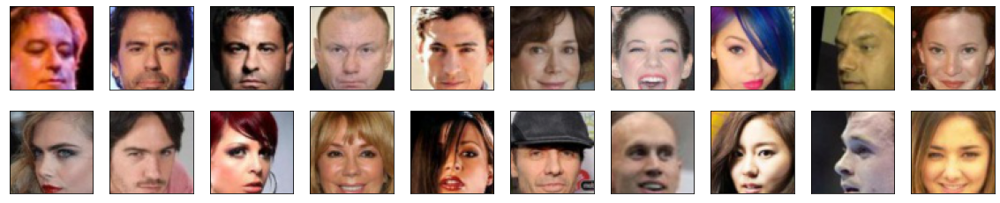

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
import torch.nn as nn
from torch.nn import Module

In [8]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.disc = nn.Sequential(

            nn.Conv2d(3,32,4,stride =2,padding=1,bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),

            nn.Conv2d(32,64,4,stride =2,padding=1,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64,128,4,stride =2,padding=1,bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128,256,4,stride =2,padding=1,bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.Linear(256*4*4,1)
        )

        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.disc(x) 
        return x.view(-1, 1, 1, 1)

In [9]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()

tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [10]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, 4, 1, 0, bias=False),  # Output: 4x4
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),  # Output: 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),  # Output: 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),  # Output: 32x32
            nn.BatchNorm2d(32),
            nn.ReLU(True),

            nn.ConvTranspose2d(32, 3, 4, 2, 1, bias=False),  # Output: 64x64
            nn.Tanh()
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        return self.gen(x)

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [12]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(), lr= 0.0002)
    d_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0002)
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [13]:
def generator_loss(fake_logits,smooth = False):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    criteria = nn.BCEWithLogitsLoss()
    if smooth:
        labels = torch.ones_like(fake_logits) * 0.9
    else:
        labels = torch.ones_like(fake_logits)
    loss = criteria(fake_logits, labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [14]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    criteria = nn.BCEWithLogitsLoss()
    
    real_loss = criteria(real_logits,torch.ones_like(real_logits))
    
    fake_loss = criteria(fake_logits,torch.zeros_like(fake_logits))
    
    loss = real_loss + fake_loss
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [15]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [16]:
def generator_step(batch_size: int, latent_dim: int, generator, discriminator, optimizer_g, device) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    z = torch.randn(batch_size, latent_dim, 1, 1).to(device)  # Latent space
    fake_images = generator(z)
    
    # 2. Loss calculation: Get discriminator's prediction for fake images
    fake_logits = discriminator(fake_images)
    g_loss = generator_loss(fake_logits)  # Compute generator loss
    
    # 3. Backward pass: Zero gradients, backpropagate and update generator
    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()
    
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor, generator, discriminator, optimizer_d, device) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    z = torch.randn(batch_size, latent_dim, 1, 1).to(device)  # Latent space
    fake_images = generator(z).detach()  # Don't compute gradients for fake images during discriminator step
    
    
    noise_std = 0.1
    real_images = real_images + noise_std * torch.randn_like(real_images)
    
    real_logits = discriminator(real_images)
    fake_logits = discriminator(fake_images)
    
    # 2. Loss calculation: Compute discriminator's loss
    d_loss = discriminator_loss(real_logits, fake_logits)  # Discriminator loss
    
    optimizer_d.zero_grad()
    d_loss.backward()
    optimizer_d.step()
    
    return {'loss': d_loss}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [17]:
from datetime import datetime

In [18]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [19]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [20]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2025-02-18 17:00:28 | Epoch [1/20] | Batch 0/509 | d_loss: 1.5602 | g_loss: 0.6291
2025-02-18 17:00:32 | Epoch [1/20] | Batch 50/509 | d_loss: 0.6444 | g_loss: 3.0159
2025-02-18 17:00:37 | Epoch [1/20] | Batch 100/509 | d_loss: 1.4647 | g_loss: 2.2565
2025-02-18 17:00:41 | Epoch [1/20] | Batch 150/509 | d_loss: 0.8903 | g_loss: 2.8279
2025-02-18 17:00:46 | Epoch [1/20] | Batch 200/509 | d_loss: 0.3828 | g_loss: 2.5836
2025-02-18 17:00:50 | Epoch [1/20] | Batch 250/509 | d_loss: 0.4008 | g_loss: 3.0170
2025-02-18 17:00:54 | Epoch [1/20] | Batch 300/509 | d_loss: 0.1107 | g_loss: 3.7024
2025-02-18 17:00:59 | Epoch [1/20] | Batch 350/509 | d_loss: 0.2060 | g_loss: 3.7876
2025-02-18 17:01:03 | Epoch [1/20] | Batch 400/509 | d_loss: 0.0658 | g_loss: 4.1266
2025-02-18 17:01:07 | Epoch [1/20] | Batch 450/509 | d_loss: 0.0581 | g_loss: 4.2249
2025-02-18 17:01:12 | Epoch [1/20] | Batch 500/509 | d_loss: 0.0183 | g_loss: 4.7454


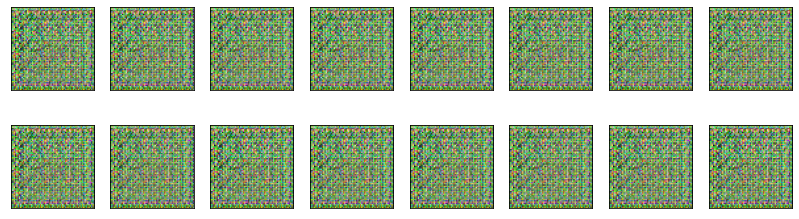

2025-02-18 17:01:17 | Epoch [2/20] | Batch 0/509 | d_loss: 0.0361 | g_loss: 4.1133
2025-02-18 17:01:21 | Epoch [2/20] | Batch 50/509 | d_loss: 0.0262 | g_loss: 4.9288
2025-02-18 17:01:25 | Epoch [2/20] | Batch 100/509 | d_loss: 0.0247 | g_loss: 5.1055
2025-02-18 17:01:30 | Epoch [2/20] | Batch 150/509 | d_loss: 0.6468 | g_loss: 3.3208
2025-02-18 17:01:34 | Epoch [2/20] | Batch 200/509 | d_loss: 0.8860 | g_loss: 2.2949
2025-02-18 17:01:39 | Epoch [2/20] | Batch 250/509 | d_loss: 1.0073 | g_loss: 1.5608
2025-02-18 17:01:44 | Epoch [2/20] | Batch 300/509 | d_loss: 0.3718 | g_loss: 2.4977
2025-02-18 17:01:48 | Epoch [2/20] | Batch 350/509 | d_loss: 0.8251 | g_loss: 2.2278
2025-02-18 17:01:53 | Epoch [2/20] | Batch 400/509 | d_loss: 0.9491 | g_loss: 3.0224
2025-02-18 17:01:57 | Epoch [2/20] | Batch 450/509 | d_loss: 1.1510 | g_loss: 1.8198
2025-02-18 17:02:01 | Epoch [2/20] | Batch 500/509 | d_loss: 1.3884 | g_loss: 1.7830


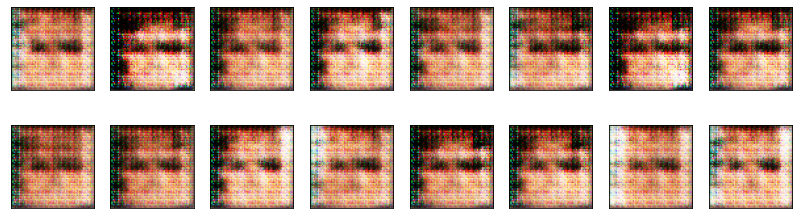

2025-02-18 17:02:05 | Epoch [3/20] | Batch 0/509 | d_loss: 0.8280 | g_loss: 2.9384
2025-02-18 17:02:10 | Epoch [3/20] | Batch 50/509 | d_loss: 1.1731 | g_loss: 1.6047
2025-02-18 17:02:14 | Epoch [3/20] | Batch 100/509 | d_loss: 0.7305 | g_loss: 1.9808
2025-02-18 17:02:18 | Epoch [3/20] | Batch 150/509 | d_loss: 1.2952 | g_loss: 1.1368
2025-02-18 17:02:23 | Epoch [3/20] | Batch 200/509 | d_loss: 0.9374 | g_loss: 1.2227
2025-02-18 17:02:27 | Epoch [3/20] | Batch 250/509 | d_loss: 1.3429 | g_loss: 1.4901
2025-02-18 17:02:32 | Epoch [3/20] | Batch 300/509 | d_loss: 1.3315 | g_loss: 2.3368
2025-02-18 17:02:36 | Epoch [3/20] | Batch 350/509 | d_loss: 2.0775 | g_loss: 1.4132
2025-02-18 17:02:41 | Epoch [3/20] | Batch 400/509 | d_loss: 2.0793 | g_loss: 1.2448
2025-02-18 17:02:45 | Epoch [3/20] | Batch 450/509 | d_loss: 2.3638 | g_loss: 1.6430
2025-02-18 17:02:50 | Epoch [3/20] | Batch 500/509 | d_loss: 0.6346 | g_loss: 2.0578


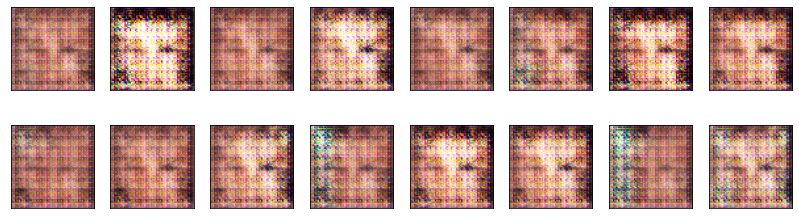

2025-02-18 17:02:53 | Epoch [4/20] | Batch 0/509 | d_loss: 1.1546 | g_loss: 1.8202
2025-02-18 17:02:58 | Epoch [4/20] | Batch 50/509 | d_loss: 2.0545 | g_loss: 1.4832
2025-02-18 17:03:02 | Epoch [4/20] | Batch 100/509 | d_loss: 1.5549 | g_loss: 1.1958
2025-02-18 17:03:07 | Epoch [4/20] | Batch 150/509 | d_loss: 1.0228 | g_loss: 1.3096
2025-02-18 17:03:11 | Epoch [4/20] | Batch 200/509 | d_loss: 0.9260 | g_loss: 1.3840
2025-02-18 17:03:16 | Epoch [4/20] | Batch 250/509 | d_loss: 1.2095 | g_loss: 1.2415
2025-02-18 17:03:20 | Epoch [4/20] | Batch 300/509 | d_loss: 1.3930 | g_loss: 1.1924
2025-02-18 17:03:25 | Epoch [4/20] | Batch 350/509 | d_loss: 1.5509 | g_loss: 0.9451
2025-02-18 17:03:29 | Epoch [4/20] | Batch 400/509 | d_loss: 1.3765 | g_loss: 1.2256
2025-02-18 17:03:34 | Epoch [4/20] | Batch 450/509 | d_loss: 1.9833 | g_loss: 1.6380
2025-02-18 17:03:38 | Epoch [4/20] | Batch 500/509 | d_loss: 1.3456 | g_loss: 1.3715


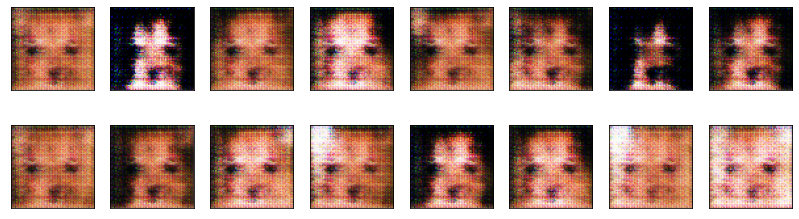

2025-02-18 17:03:42 | Epoch [5/20] | Batch 0/509 | d_loss: 1.5953 | g_loss: 1.1251
2025-02-18 17:03:47 | Epoch [5/20] | Batch 50/509 | d_loss: 1.0365 | g_loss: 1.1279
2025-02-18 17:03:51 | Epoch [5/20] | Batch 100/509 | d_loss: 1.2944 | g_loss: 1.4280
2025-02-18 17:03:56 | Epoch [5/20] | Batch 150/509 | d_loss: 1.6463 | g_loss: 1.6625
2025-02-18 17:04:00 | Epoch [5/20] | Batch 200/509 | d_loss: 1.1939 | g_loss: 1.2127
2025-02-18 17:04:05 | Epoch [5/20] | Batch 250/509 | d_loss: 1.3693 | g_loss: 0.9265
2025-02-18 17:04:09 | Epoch [5/20] | Batch 300/509 | d_loss: 1.4578 | g_loss: 1.0748
2025-02-18 17:04:14 | Epoch [5/20] | Batch 350/509 | d_loss: 0.8299 | g_loss: 1.3555
2025-02-18 17:04:18 | Epoch [5/20] | Batch 400/509 | d_loss: 1.1190 | g_loss: 1.3274
2025-02-18 17:04:23 | Epoch [5/20] | Batch 450/509 | d_loss: 1.6058 | g_loss: 0.9379
2025-02-18 17:04:27 | Epoch [5/20] | Batch 500/509 | d_loss: 1.2221 | g_loss: 1.0788


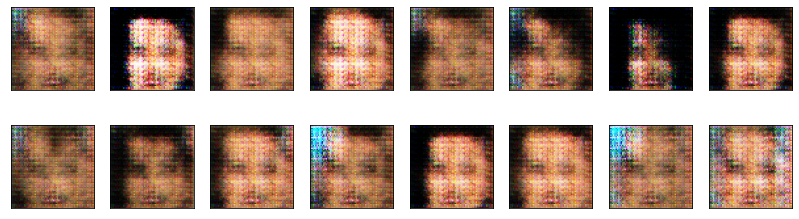

2025-02-18 17:04:32 | Epoch [6/20] | Batch 0/509 | d_loss: 1.3820 | g_loss: 0.9736
2025-02-18 17:04:37 | Epoch [6/20] | Batch 50/509 | d_loss: 0.9442 | g_loss: 1.5072
2025-02-18 17:04:41 | Epoch [6/20] | Batch 100/509 | d_loss: 1.8375 | g_loss: 1.0297
2025-02-18 17:04:46 | Epoch [6/20] | Batch 150/509 | d_loss: 1.5433 | g_loss: 1.2999
2025-02-18 17:04:50 | Epoch [6/20] | Batch 200/509 | d_loss: 0.8546 | g_loss: 1.6865
2025-02-18 17:04:55 | Epoch [6/20] | Batch 250/509 | d_loss: 1.5912 | g_loss: 0.9900
2025-02-18 17:04:59 | Epoch [6/20] | Batch 300/509 | d_loss: 1.2997 | g_loss: 1.1733
2025-02-18 17:05:04 | Epoch [6/20] | Batch 350/509 | d_loss: 1.8187 | g_loss: 0.7678
2025-02-18 17:05:08 | Epoch [6/20] | Batch 400/509 | d_loss: 1.4146 | g_loss: 1.2877
2025-02-18 17:05:13 | Epoch [6/20] | Batch 450/509 | d_loss: 0.7618 | g_loss: 1.8271
2025-02-18 17:05:17 | Epoch [6/20] | Batch 500/509 | d_loss: 1.9595 | g_loss: 1.4332


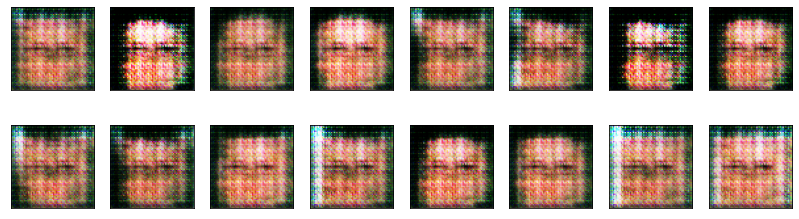

2025-02-18 17:05:21 | Epoch [7/20] | Batch 0/509 | d_loss: 1.5652 | g_loss: 1.3607
2025-02-18 17:05:26 | Epoch [7/20] | Batch 50/509 | d_loss: 0.8453 | g_loss: 1.5232
2025-02-18 17:05:30 | Epoch [7/20] | Batch 100/509 | d_loss: 1.5660 | g_loss: 1.0272
2025-02-18 17:05:35 | Epoch [7/20] | Batch 150/509 | d_loss: 2.2290 | g_loss: 1.1652
2025-02-18 17:05:40 | Epoch [7/20] | Batch 200/509 | d_loss: 1.9046 | g_loss: 0.7687
2025-02-18 17:05:44 | Epoch [7/20] | Batch 250/509 | d_loss: 1.3904 | g_loss: 1.0440
2025-02-18 17:05:49 | Epoch [7/20] | Batch 300/509 | d_loss: 1.2968 | g_loss: 0.9382
2025-02-18 17:05:53 | Epoch [7/20] | Batch 350/509 | d_loss: 1.1534 | g_loss: 1.1476
2025-02-18 17:05:57 | Epoch [7/20] | Batch 400/509 | d_loss: 1.2338 | g_loss: 1.0150
2025-02-18 17:06:02 | Epoch [7/20] | Batch 450/509 | d_loss: 1.5514 | g_loss: 0.9631
2025-02-18 17:06:06 | Epoch [7/20] | Batch 500/509 | d_loss: 1.7080 | g_loss: 0.9351


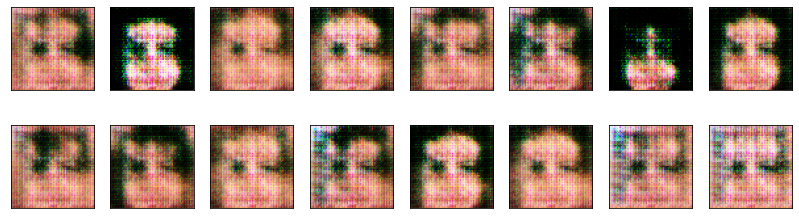

2025-02-18 17:06:11 | Epoch [8/20] | Batch 0/509 | d_loss: 1.3763 | g_loss: 1.2421
2025-02-18 17:06:15 | Epoch [8/20] | Batch 50/509 | d_loss: 1.1516 | g_loss: 0.9591
2025-02-18 17:06:20 | Epoch [8/20] | Batch 100/509 | d_loss: 1.6423 | g_loss: 1.0925
2025-02-18 17:06:24 | Epoch [8/20] | Batch 150/509 | d_loss: 1.9748 | g_loss: 0.9580
2025-02-18 17:06:28 | Epoch [8/20] | Batch 200/509 | d_loss: 1.3126 | g_loss: 0.9394
2025-02-18 17:06:33 | Epoch [8/20] | Batch 250/509 | d_loss: 2.1592 | g_loss: 0.8411
2025-02-18 17:06:37 | Epoch [8/20] | Batch 300/509 | d_loss: 0.8023 | g_loss: 1.4734
2025-02-18 17:06:41 | Epoch [8/20] | Batch 350/509 | d_loss: 1.5358 | g_loss: 1.1756
2025-02-18 17:06:46 | Epoch [8/20] | Batch 400/509 | d_loss: 1.7681 | g_loss: 0.8838
2025-02-18 17:06:50 | Epoch [8/20] | Batch 450/509 | d_loss: 1.6880 | g_loss: 0.7663
2025-02-18 17:06:55 | Epoch [8/20] | Batch 500/509 | d_loss: 1.4599 | g_loss: 0.9455


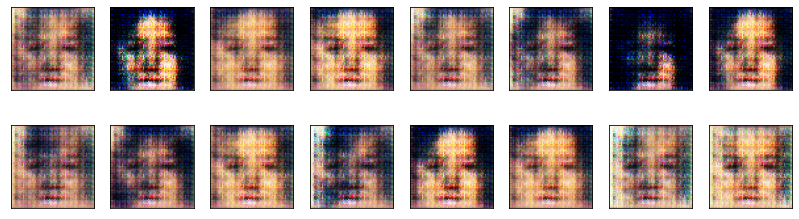

2025-02-18 17:06:58 | Epoch [9/20] | Batch 0/509 | d_loss: 1.5017 | g_loss: 0.8863
2025-02-18 17:07:03 | Epoch [9/20] | Batch 50/509 | d_loss: 1.3315 | g_loss: 1.0921
2025-02-18 17:07:07 | Epoch [9/20] | Batch 100/509 | d_loss: 1.4444 | g_loss: 1.0957
2025-02-18 17:07:12 | Epoch [9/20] | Batch 150/509 | d_loss: 1.3455 | g_loss: 1.0701
2025-02-18 17:07:16 | Epoch [9/20] | Batch 200/509 | d_loss: 1.4743 | g_loss: 1.0593
2025-02-18 17:07:21 | Epoch [9/20] | Batch 250/509 | d_loss: 2.2888 | g_loss: 0.6474
2025-02-18 17:07:25 | Epoch [9/20] | Batch 300/509 | d_loss: 1.6917 | g_loss: 1.1106
2025-02-18 17:07:30 | Epoch [9/20] | Batch 350/509 | d_loss: 1.1308 | g_loss: 1.0871
2025-02-18 17:07:34 | Epoch [9/20] | Batch 400/509 | d_loss: 1.1343 | g_loss: 0.9757
2025-02-18 17:07:39 | Epoch [9/20] | Batch 450/509 | d_loss: 1.3014 | g_loss: 1.0396
2025-02-18 17:07:43 | Epoch [9/20] | Batch 500/509 | d_loss: 1.4291 | g_loss: 1.1473


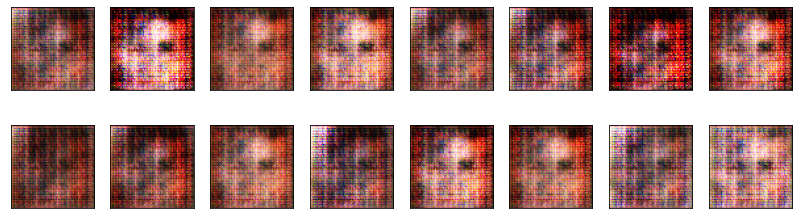

2025-02-18 17:07:47 | Epoch [10/20] | Batch 0/509 | d_loss: 1.7100 | g_loss: 1.0941
2025-02-18 17:07:51 | Epoch [10/20] | Batch 50/509 | d_loss: 1.7034 | g_loss: 0.9812
2025-02-18 17:07:55 | Epoch [10/20] | Batch 100/509 | d_loss: 1.8346 | g_loss: 0.9512
2025-02-18 17:08:00 | Epoch [10/20] | Batch 150/509 | d_loss: 1.5423 | g_loss: 0.7888
2025-02-18 17:08:05 | Epoch [10/20] | Batch 200/509 | d_loss: 1.4096 | g_loss: 1.0295
2025-02-18 17:08:09 | Epoch [10/20] | Batch 250/509 | d_loss: 1.2906 | g_loss: 1.1013
2025-02-18 17:08:13 | Epoch [10/20] | Batch 300/509 | d_loss: 2.2448 | g_loss: 0.8952
2025-02-18 17:08:18 | Epoch [10/20] | Batch 350/509 | d_loss: 1.7423 | g_loss: 0.6863
2025-02-18 17:08:22 | Epoch [10/20] | Batch 400/509 | d_loss: 1.0770 | g_loss: 1.0254
2025-02-18 17:08:27 | Epoch [10/20] | Batch 450/509 | d_loss: 1.7469 | g_loss: 0.7418
2025-02-18 17:08:31 | Epoch [10/20] | Batch 500/509 | d_loss: 0.8318 | g_loss: 1.2845


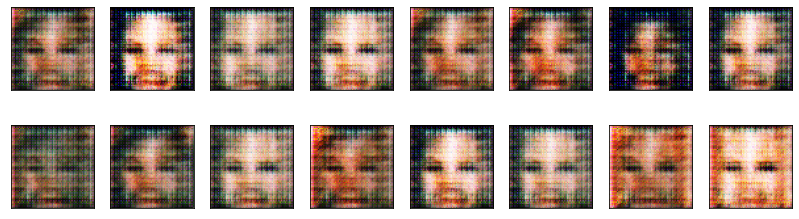

2025-02-18 17:08:35 | Epoch [11/20] | Batch 0/509 | d_loss: 0.8892 | g_loss: 1.0944
2025-02-18 17:08:40 | Epoch [11/20] | Batch 50/509 | d_loss: 0.9898 | g_loss: 1.4887
2025-02-18 17:08:44 | Epoch [11/20] | Batch 100/509 | d_loss: 1.2868 | g_loss: 0.9150
2025-02-18 17:08:49 | Epoch [11/20] | Batch 150/509 | d_loss: 1.4445 | g_loss: 1.1980
2025-02-18 17:08:53 | Epoch [11/20] | Batch 200/509 | d_loss: 1.4060 | g_loss: 1.1732
2025-02-18 17:08:57 | Epoch [11/20] | Batch 250/509 | d_loss: 1.2556 | g_loss: 0.9989
2025-02-18 17:09:02 | Epoch [11/20] | Batch 300/509 | d_loss: 1.9153 | g_loss: 0.8626
2025-02-18 17:09:06 | Epoch [11/20] | Batch 350/509 | d_loss: 1.3342 | g_loss: 1.0941
2025-02-18 17:09:11 | Epoch [11/20] | Batch 400/509 | d_loss: 1.2252 | g_loss: 1.1971
2025-02-18 17:09:15 | Epoch [11/20] | Batch 450/509 | d_loss: 1.8962 | g_loss: 0.9090
2025-02-18 17:09:19 | Epoch [11/20] | Batch 500/509 | d_loss: 1.8125 | g_loss: 0.7518


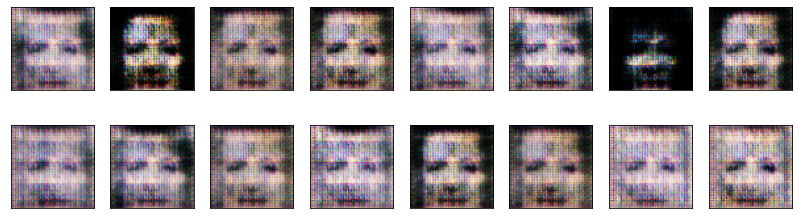

2025-02-18 17:09:24 | Epoch [12/20] | Batch 0/509 | d_loss: 1.8240 | g_loss: 0.8389
2025-02-18 17:09:29 | Epoch [12/20] | Batch 50/509 | d_loss: 1.0435 | g_loss: 0.9665
2025-02-18 17:09:33 | Epoch [12/20] | Batch 100/509 | d_loss: 1.4620 | g_loss: 0.8608
2025-02-18 17:09:37 | Epoch [12/20] | Batch 150/509 | d_loss: 1.6736 | g_loss: 0.9571
2025-02-18 17:09:43 | Epoch [12/20] | Batch 200/509 | d_loss: 1.7137 | g_loss: 0.7037
2025-02-18 17:09:47 | Epoch [12/20] | Batch 250/509 | d_loss: 1.3747 | g_loss: 0.8212
2025-02-18 17:09:51 | Epoch [12/20] | Batch 300/509 | d_loss: 1.0870 | g_loss: 1.2520
2025-02-18 17:09:56 | Epoch [12/20] | Batch 350/509 | d_loss: 1.1375 | g_loss: 1.1154
2025-02-18 17:10:00 | Epoch [12/20] | Batch 400/509 | d_loss: 1.7077 | g_loss: 0.7579
2025-02-18 17:10:04 | Epoch [12/20] | Batch 450/509 | d_loss: 1.1808 | g_loss: 1.0503
2025-02-18 17:10:09 | Epoch [12/20] | Batch 500/509 | d_loss: 1.4678 | g_loss: 0.9222


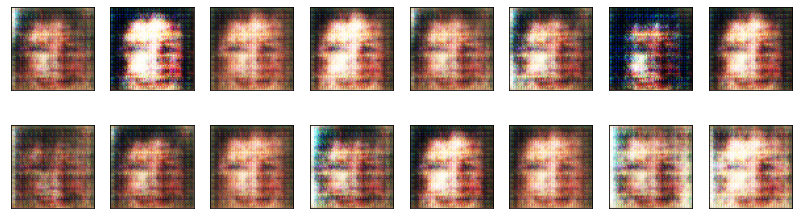

2025-02-18 17:10:13 | Epoch [13/20] | Batch 0/509 | d_loss: 1.3924 | g_loss: 0.8391
2025-02-18 17:10:18 | Epoch [13/20] | Batch 50/509 | d_loss: 1.3729 | g_loss: 0.8720
2025-02-18 17:10:23 | Epoch [13/20] | Batch 100/509 | d_loss: 1.0501 | g_loss: 1.2788
2025-02-18 17:10:27 | Epoch [13/20] | Batch 150/509 | d_loss: 1.9532 | g_loss: 0.6944
2025-02-18 17:10:31 | Epoch [13/20] | Batch 200/509 | d_loss: 1.7979 | g_loss: 0.8289
2025-02-18 17:10:36 | Epoch [13/20] | Batch 250/509 | d_loss: 1.4206 | g_loss: 0.7349
2025-02-18 17:10:40 | Epoch [13/20] | Batch 300/509 | d_loss: 1.1821 | g_loss: 0.9942
2025-02-18 17:10:45 | Epoch [13/20] | Batch 350/509 | d_loss: 0.9986 | g_loss: 1.1497
2025-02-18 17:10:49 | Epoch [13/20] | Batch 400/509 | d_loss: 1.6921 | g_loss: 0.5767
2025-02-18 17:10:54 | Epoch [13/20] | Batch 450/509 | d_loss: 1.1261 | g_loss: 1.0713
2025-02-18 17:10:58 | Epoch [13/20] | Batch 500/509 | d_loss: 1.6997 | g_loss: 1.3716


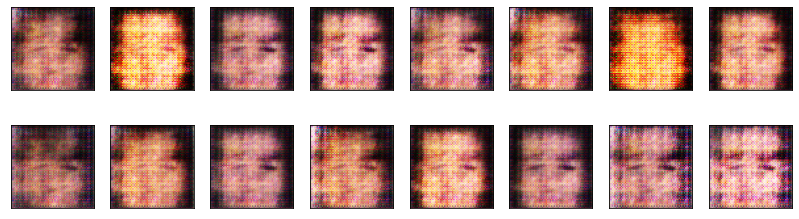

2025-02-18 17:11:03 | Epoch [14/20] | Batch 0/509 | d_loss: 1.8648 | g_loss: 0.6592
2025-02-18 17:11:07 | Epoch [14/20] | Batch 50/509 | d_loss: 1.2480 | g_loss: 0.8959
2025-02-18 17:11:12 | Epoch [14/20] | Batch 100/509 | d_loss: 1.2519 | g_loss: 0.9338
2025-02-18 17:11:16 | Epoch [14/20] | Batch 150/509 | d_loss: 2.7891 | g_loss: 0.7903
2025-02-18 17:11:21 | Epoch [14/20] | Batch 200/509 | d_loss: 1.5346 | g_loss: 0.6969
2025-02-18 17:11:25 | Epoch [14/20] | Batch 250/509 | d_loss: 1.4423 | g_loss: 0.8609
2025-02-18 17:11:30 | Epoch [14/20] | Batch 300/509 | d_loss: 1.9273 | g_loss: 0.7344
2025-02-18 17:11:34 | Epoch [14/20] | Batch 350/509 | d_loss: 1.3822 | g_loss: 0.8893
2025-02-18 17:11:39 | Epoch [14/20] | Batch 400/509 | d_loss: 1.1187 | g_loss: 1.1186
2025-02-18 17:11:43 | Epoch [14/20] | Batch 450/509 | d_loss: 1.3882 | g_loss: 0.9174
2025-02-18 17:11:48 | Epoch [14/20] | Batch 500/509 | d_loss: 1.2693 | g_loss: 1.2471


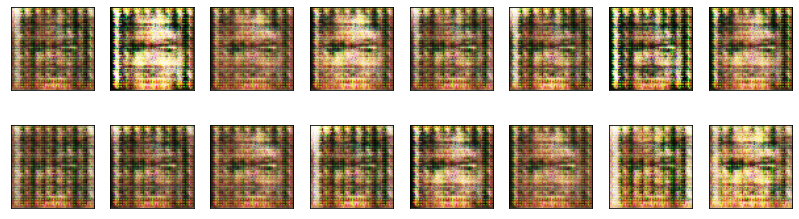

2025-02-18 17:11:52 | Epoch [15/20] | Batch 0/509 | d_loss: 1.3250 | g_loss: 1.1212
2025-02-18 17:11:57 | Epoch [15/20] | Batch 50/509 | d_loss: 1.1909 | g_loss: 0.9614
2025-02-18 17:12:01 | Epoch [15/20] | Batch 100/509 | d_loss: 1.1848 | g_loss: 1.0118
2025-02-18 17:12:06 | Epoch [15/20] | Batch 150/509 | d_loss: 1.6492 | g_loss: 0.8434
2025-02-18 17:12:10 | Epoch [15/20] | Batch 200/509 | d_loss: 1.2242 | g_loss: 0.9512
2025-02-18 17:12:14 | Epoch [15/20] | Batch 250/509 | d_loss: 1.4783 | g_loss: 0.7544
2025-02-18 17:12:19 | Epoch [15/20] | Batch 300/509 | d_loss: 1.3333 | g_loss: 0.9763
2025-02-18 17:12:23 | Epoch [15/20] | Batch 350/509 | d_loss: 1.0345 | g_loss: 1.0569
2025-02-18 17:12:28 | Epoch [15/20] | Batch 400/509 | d_loss: 1.3939 | g_loss: 0.9370
2025-02-18 17:12:32 | Epoch [15/20] | Batch 450/509 | d_loss: 1.4314 | g_loss: 0.8927
2025-02-18 17:12:37 | Epoch [15/20] | Batch 500/509 | d_loss: 1.4326 | g_loss: 0.8937


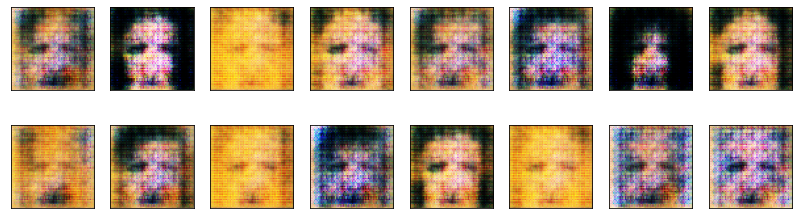

2025-02-18 17:12:42 | Epoch [16/20] | Batch 0/509 | d_loss: 1.1923 | g_loss: 0.9550
2025-02-18 17:12:46 | Epoch [16/20] | Batch 50/509 | d_loss: 1.2738 | g_loss: 1.1411
2025-02-18 17:12:50 | Epoch [16/20] | Batch 100/509 | d_loss: 1.2280 | g_loss: 0.9911
2025-02-18 17:12:55 | Epoch [16/20] | Batch 150/509 | d_loss: 1.4857 | g_loss: 0.9623
2025-02-18 17:12:59 | Epoch [16/20] | Batch 200/509 | d_loss: 1.0915 | g_loss: 1.1940
2025-02-18 17:13:03 | Epoch [16/20] | Batch 250/509 | d_loss: 1.2198 | g_loss: 0.9301
2025-02-18 17:13:08 | Epoch [16/20] | Batch 300/509 | d_loss: 1.9868 | g_loss: 0.8517
2025-02-18 17:13:12 | Epoch [16/20] | Batch 350/509 | d_loss: 0.9886 | g_loss: 1.2021
2025-02-18 17:13:16 | Epoch [16/20] | Batch 400/509 | d_loss: 1.1941 | g_loss: 1.2607
2025-02-18 17:13:21 | Epoch [16/20] | Batch 450/509 | d_loss: 1.2935 | g_loss: 1.0725
2025-02-18 17:13:25 | Epoch [16/20] | Batch 500/509 | d_loss: 1.5118 | g_loss: 0.9991


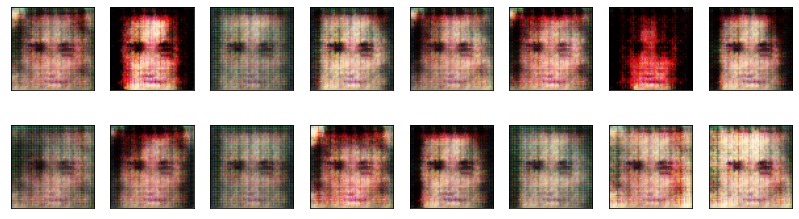

2025-02-18 17:13:30 | Epoch [17/20] | Batch 0/509 | d_loss: 1.9831 | g_loss: 0.7158
2025-02-18 17:13:35 | Epoch [17/20] | Batch 50/509 | d_loss: 1.2296 | g_loss: 1.0079
2025-02-18 17:13:40 | Epoch [17/20] | Batch 100/509 | d_loss: 1.3479 | g_loss: 0.8924
2025-02-18 17:13:44 | Epoch [17/20] | Batch 150/509 | d_loss: 1.1011 | g_loss: 1.1966
2025-02-18 17:13:49 | Epoch [17/20] | Batch 200/509 | d_loss: 1.2806 | g_loss: 0.7208
2025-02-18 17:13:53 | Epoch [17/20] | Batch 250/509 | d_loss: 0.9050 | g_loss: 1.6085
2025-02-18 17:13:58 | Epoch [17/20] | Batch 300/509 | d_loss: 1.2533 | g_loss: 0.7894
2025-02-18 17:14:02 | Epoch [17/20] | Batch 350/509 | d_loss: 1.6210 | g_loss: 0.7041
2025-02-18 17:14:07 | Epoch [17/20] | Batch 400/509 | d_loss: 1.4184 | g_loss: 0.8376
2025-02-18 17:14:11 | Epoch [17/20] | Batch 450/509 | d_loss: 1.4311 | g_loss: 1.1172
2025-02-18 17:14:15 | Epoch [17/20] | Batch 500/509 | d_loss: 1.2825 | g_loss: 1.1229


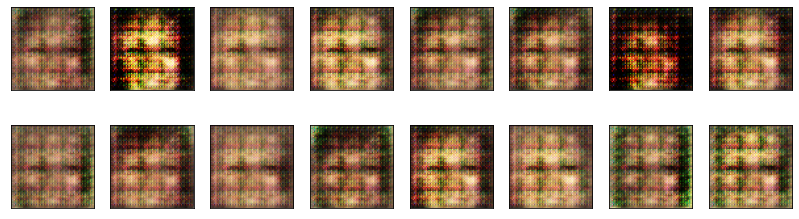

2025-02-18 17:14:20 | Epoch [18/20] | Batch 0/509 | d_loss: 0.7537 | g_loss: 1.1448
2025-02-18 17:14:24 | Epoch [18/20] | Batch 50/509 | d_loss: 1.5719 | g_loss: 1.1390
2025-02-18 17:14:29 | Epoch [18/20] | Batch 100/509 | d_loss: 1.1780 | g_loss: 1.0333
2025-02-18 17:14:33 | Epoch [18/20] | Batch 150/509 | d_loss: 1.1687 | g_loss: 1.0105
2025-02-18 17:14:38 | Epoch [18/20] | Batch 200/509 | d_loss: 1.1484 | g_loss: 1.2532
2025-02-18 17:14:42 | Epoch [18/20] | Batch 250/509 | d_loss: 1.3198 | g_loss: 0.9778
2025-02-18 17:14:46 | Epoch [18/20] | Batch 300/509 | d_loss: 1.3877 | g_loss: 1.0447
2025-02-18 17:14:51 | Epoch [18/20] | Batch 350/509 | d_loss: 0.8066 | g_loss: 1.2454
2025-02-18 17:14:55 | Epoch [18/20] | Batch 400/509 | d_loss: 0.9528 | g_loss: 1.0779
2025-02-18 17:14:59 | Epoch [18/20] | Batch 450/509 | d_loss: 1.2235 | g_loss: 0.9175
2025-02-18 17:15:04 | Epoch [18/20] | Batch 500/509 | d_loss: 1.2451 | g_loss: 0.8004


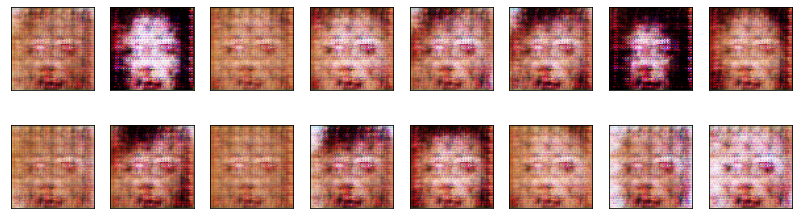

2025-02-18 17:15:08 | Epoch [19/20] | Batch 0/509 | d_loss: 1.1779 | g_loss: 1.0906
2025-02-18 17:15:13 | Epoch [19/20] | Batch 50/509 | d_loss: 1.2847 | g_loss: 1.4443
2025-02-18 17:15:17 | Epoch [19/20] | Batch 100/509 | d_loss: 1.1673 | g_loss: 1.3572
2025-02-18 17:15:22 | Epoch [19/20] | Batch 150/509 | d_loss: 1.1835 | g_loss: 1.2210
2025-02-18 17:15:26 | Epoch [19/20] | Batch 200/509 | d_loss: 0.9328 | g_loss: 1.2062
2025-02-18 17:15:31 | Epoch [19/20] | Batch 250/509 | d_loss: 1.2011 | g_loss: 1.0390
2025-02-18 17:15:35 | Epoch [19/20] | Batch 300/509 | d_loss: 0.9161 | g_loss: 1.1342
2025-02-18 17:15:40 | Epoch [19/20] | Batch 350/509 | d_loss: 0.8937 | g_loss: 1.5489
2025-02-18 17:15:45 | Epoch [19/20] | Batch 400/509 | d_loss: 1.1316 | g_loss: 0.9450
2025-02-18 17:15:49 | Epoch [19/20] | Batch 450/509 | d_loss: 1.1604 | g_loss: 1.0263
2025-02-18 17:15:54 | Epoch [19/20] | Batch 500/509 | d_loss: 1.2122 | g_loss: 0.9683


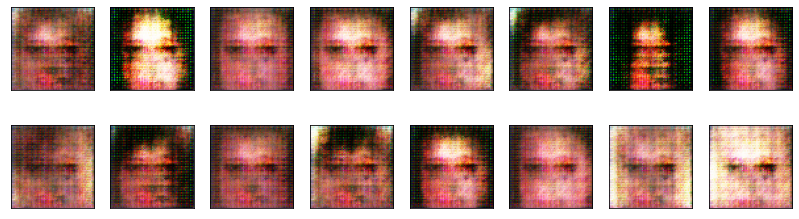

2025-02-18 17:15:58 | Epoch [20/20] | Batch 0/509 | d_loss: 1.2974 | g_loss: 0.9991
2025-02-18 17:16:03 | Epoch [20/20] | Batch 50/509 | d_loss: 0.6297 | g_loss: 1.3989
2025-02-18 17:16:07 | Epoch [20/20] | Batch 100/509 | d_loss: 1.2985 | g_loss: 0.9784
2025-02-18 17:16:12 | Epoch [20/20] | Batch 150/509 | d_loss: 1.4813 | g_loss: 0.9575
2025-02-18 17:16:16 | Epoch [20/20] | Batch 200/509 | d_loss: 1.1178 | g_loss: 1.3165
2025-02-18 17:16:21 | Epoch [20/20] | Batch 250/509 | d_loss: 1.6283 | g_loss: 0.9276
2025-02-18 17:16:25 | Epoch [20/20] | Batch 300/509 | d_loss: 1.0260 | g_loss: 1.1102
2025-02-18 17:16:30 | Epoch [20/20] | Batch 350/509 | d_loss: 1.3926 | g_loss: 0.9770
2025-02-18 17:16:34 | Epoch [20/20] | Batch 400/509 | d_loss: 0.8824 | g_loss: 1.3544
2025-02-18 17:16:39 | Epoch [20/20] | Batch 450/509 | d_loss: 1.1971 | g_loss: 0.9990
2025-02-18 17:16:43 | Epoch [20/20] | Batch 500/509 | d_loss: 1.4648 | g_loss: 1.3943


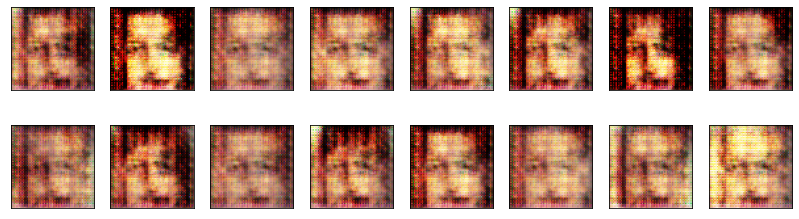

In [21]:
gen_steps = 2
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        d_loss = discriminator_step(
            batch_size=batch_size, 
            latent_dim=latent_dim, 
            real_images=real_images, 
            generator=generator, 
            discriminator=discriminator, 
            optimizer_d=d_optimizer, 
            device=device
        )
        
        for _ in range(gen_steps):
        ####### Train the Generator ########
            g_loss = generator_step(
                batch_size=batch_size, 
                latent_dim=latent_dim, 
                generator=generator, 
                discriminator=discriminator, 
                optimizer_g=g_optimizer, 
                device=device
            )
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

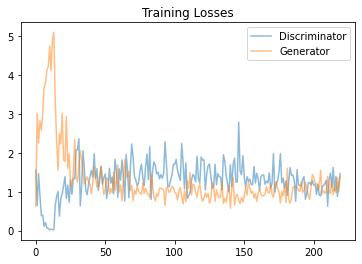

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 
The bias introduced due to white faces dataset can be overcomed by using image augmentation techniques or using diverse dataset.Model size used is relatively same for less no. of epochs therefore capturing less amount of features.Using learning rate decay or adaptive rate scheduling can improve the generation process.Using Wassserstein loss for better stability will improve performance.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.